In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

## Step. Combine Questions & Answers data

In [2]:
q_df = pd.read_csv('./data/questions.csv')
a_df = pd.read_csv('./data/answers.csv')

In [3]:
a_df = a_df.dropna(axis=0, how='any')
q_df = q_df.dropna(axis=0, how='any')

In [4]:
qa_df = pd.merge(q_df,a_df, left_on = 'questions_id', right_on = 'answers_question_id', how='outer')
qa_df.head()

,questions_id,questions_author_id,questions_date_added,questions_title,questions_body,answers_id,answers_author_id,answers_question_id,answers_date_added,answers_body
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,332a511f1569444485cf7a7a556a5e54,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...
1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,eb80205482e4424cad8f16bc25aa2d9c,2018-05-01 14:19:08 UTC+0000,<p>Hi. I joined the Army after I attended coll...
2,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,eaa66ef919bc408ab5296237440e323f,cbd8f30613a849bf918aed5c010340be,eb80205482e4424cad8f16bc25aa2d9c,2018-05-02 02:41:02 UTC+0000,"<p>Dear Priyanka,</p><p>Greetings! I have answ..."
3,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38 UTC+0000,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....,1a6b3749d391486c9e371fbd1e605014,7e72a630c303442ba92ff00e8ea451df,4ec31632938a40b98909416bdd0decff,2017-05-10 19:00:47 UTC+0000,<p>I work for a global company who values high...
4,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32 UTC+0000,To become a specialist in business management...,i hear business management is a hard way to ge...,5229c514000446d582050f89ebd4e184,17802d94699140b0a0d2995f30c034c6,2f6a9a99d9b24e5baa50d40d0ba50a75,2017-10-13 22:07:33 UTC+0000,I agree with Denise. Every single job I've had...


In [15]:
q_df.head()

,questions_id,questions_author_id,questions_date_added,questions_title,questions_body
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...
1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...
2,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38 UTC+0000,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....
3,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32 UTC+0000,To become a specialist in business management...,i hear business management is a hard way to ge...
4,5af8880460c141dbb02971a1a8369529,aa9eb1a2ab184ebbb00dc01ab663428a,2017-09-01 02:36:54 UTC+0000,Are there any scholarships out there for stude...,I'm trying to find scholarships for first year...


In [16]:
q_df.columns = ['questions_id', 'questions_author_id', 'date_added', 'questions_title', 'questions_body']
q_df.head()

,questions_id,questions_author_id,date_added,questions_title,questions_body
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...
1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...
2,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38 UTC+0000,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....
3,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32 UTC+0000,To become a specialist in business management...,i hear business management is a hard way to ge...
4,5af8880460c141dbb02971a1a8369529,aa9eb1a2ab184ebbb00dc01ab663428a,2017-09-01 02:36:54 UTC+0000,Are there any scholarships out there for stude...,I'm trying to find scholarships for first year...


In [17]:
a_df.head()

,answers_id,answers_author_id,answers_question_id,answers_date_added,answers_body
0,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,332a511f1569444485cf7a7a556a5e54,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...
1,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,eb80205482e4424cad8f16bc25aa2d9c,2018-05-01 14:19:08 UTC+0000,<p>Hi. I joined the Army after I attended coll...
2,eaa66ef919bc408ab5296237440e323f,cbd8f30613a849bf918aed5c010340be,eb80205482e4424cad8f16bc25aa2d9c,2018-05-02 02:41:02 UTC+0000,"<p>Dear Priyanka,</p><p>Greetings! I have answ..."
3,1a6b3749d391486c9e371fbd1e605014,7e72a630c303442ba92ff00e8ea451df,4ec31632938a40b98909416bdd0decff,2017-05-10 19:00:47 UTC+0000,<p>I work for a global company who values high...
4,5229c514000446d582050f89ebd4e184,17802d94699140b0a0d2995f30c034c6,2f6a9a99d9b24e5baa50d40d0ba50a75,2017-10-13 22:07:33 UTC+0000,I agree with Denise. Every single job I've had...


In [18]:
a_df.columns = ['answers_id', 'answers_author_id', 'questions_id', 'date_added', 'answers_body']
a_df.head()

,answers_id,answers_author_id,questions_id,date_added,answers_body
0,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,332a511f1569444485cf7a7a556a5e54,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...
1,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,eb80205482e4424cad8f16bc25aa2d9c,2018-05-01 14:19:08 UTC+0000,<p>Hi. I joined the Army after I attended coll...
2,eaa66ef919bc408ab5296237440e323f,cbd8f30613a849bf918aed5c010340be,eb80205482e4424cad8f16bc25aa2d9c,2018-05-02 02:41:02 UTC+0000,"<p>Dear Priyanka,</p><p>Greetings! I have answ..."
3,1a6b3749d391486c9e371fbd1e605014,7e72a630c303442ba92ff00e8ea451df,4ec31632938a40b98909416bdd0decff,2017-05-10 19:00:47 UTC+0000,<p>I work for a global company who values high...
4,5229c514000446d582050f89ebd4e184,17802d94699140b0a0d2995f30c034c6,2f6a9a99d9b24e5baa50d40d0ba50a75,2017-10-13 22:07:33 UTC+0000,I agree with Denise. Every single job I've had...


In [19]:
qa_comb = pd.merge(q_df,a_df, on =['questions_id'])
qa_comb.head()

,questions_id,questions_author_id,date_added_x,questions_title,questions_body,answers_id,answers_author_id,date_added_y,answers_body
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...
1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,2018-05-01 14:19:08 UTC+0000,<p>Hi. I joined the Army after I attended coll...
2,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,eaa66ef919bc408ab5296237440e323f,cbd8f30613a849bf918aed5c010340be,2018-05-02 02:41:02 UTC+0000,"<p>Dear Priyanka,</p><p>Greetings! I have answ..."
3,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38 UTC+0000,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....,1a6b3749d391486c9e371fbd1e605014,7e72a630c303442ba92ff00e8ea451df,2017-05-10 19:00:47 UTC+0000,<p>I work for a global company who values high...
4,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32 UTC+0000,To become a specialist in business management...,i hear business management is a hard way to ge...,5229c514000446d582050f89ebd4e184,17802d94699140b0a0d2995f30c034c6,2017-10-13 22:07:33 UTC+0000,I agree with Denise. Every single job I've had...


In [20]:
qa_comb.columns = ['questions_id', 'questions_author_id', 'date_added_questions', 'questions_title', 'questions_body', 'answers_id', 'answers_author id', 'date_added_answers', 'answers_body']
qa_comb.head()

,questions_id,questions_author_id,date_added_questions,questions_title,questions_body,answers_id,answers_author id,date_added_answers,answers_body
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...
1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,2018-05-01 14:19:08 UTC+0000,<p>Hi. I joined the Army after I attended coll...
2,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,eaa66ef919bc408ab5296237440e323f,cbd8f30613a849bf918aed5c010340be,2018-05-02 02:41:02 UTC+0000,"<p>Dear Priyanka,</p><p>Greetings! I have answ..."
3,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38 UTC+0000,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....,1a6b3749d391486c9e371fbd1e605014,7e72a630c303442ba92ff00e8ea451df,2017-05-10 19:00:47 UTC+0000,<p>I work for a global company who values high...
4,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32 UTC+0000,To become a specialist in business management...,i hear business management is a hard way to ge...,5229c514000446d582050f89ebd4e184,17802d94699140b0a0d2995f30c034c6,2017-10-13 22:07:33 UTC+0000,I agree with Denise. Every single job I've had...


## 1) How many answers are provided per question?

In [7]:
df_answer_per_question=pd.DataFrame(qa_df.groupby(['questions_id'],as_index=False).count())[['questions_id','answers_id']]

In [8]:
print(df_answer_per_question.info())

df_answer_per_question=df_answer_per_question.sort_values('answers_id',ascending=False).reset_index(drop=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23931 entries, 0 to 23930
Data columns (total 2 columns):
questions_id    23931 non-null object
answers_id      23931 non-null int64
dtypes: int64(1), object(1)
memory usage: 560.9+ KB
None


In [11]:
df_answer_per_question['answers_id'].value_counts()

1     10067
2      6071
3      3160
4      2318
0       821
5       718
6       299
7       149
8        94
9        56
10       49
11       26
12       25
13       16
15       13
14       12
17        5
18        4
16        4
24        3
22        3
21        3
20        3
19        3
31        2
26        2
25        1
58        1
43        1
30        1
23        1
Name: answers_id, dtype: int64

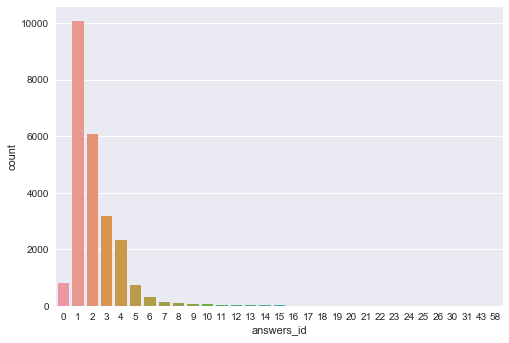

In [14]:
import seaborn as sns
sns.countplot(x='answers_id',data=df_answer_per_question)

## 2) Word Cloud: Word Frequency for Questions Title

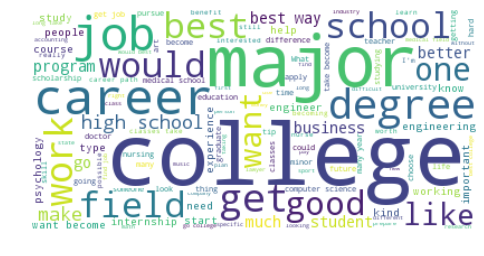

In [105]:
stop_words = ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 
              'ourselves', 'you', 'your', 'yours', 'yourself', 
              'yourselves', 'he', 'him', 'his', 'himself', 'she', 
              'her', 'hers', 'herself', 'it', 'its', 'itself', 
              'they', 'them', 'their', 'theirs', 'themselves', 
              'what', 'which', 'who', 'whom', 'this', 'that', 
              'these', 'those', 'am', 'is', 'are', 'was', 'were', 
              'be', 'been', 'being', 'have', 'has', 'had', 'having', 
              'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 
              'but', 'if', 'or', 'because', 'as', 'until', 'while', 
              'of', 'at', 'by', 'for', 'with', 'about', 'against', 
              'between', 'into', 'through', 'during', 'before', 
              'after', 'above', 'below', 'to', 'from', 'up', 'down', 
              'in', 'out', 'on', 'off', 'over', 'under', 'again', 
              'further', 'then', 'once', 'here', 'there', 'when', 
              'where', 'why', 'how', 'all', 'any', 'both', 'each', 
              'few', 'more', 'most', 'other', 'some', 'such', 'no', 
              'nor', 'not', 'only', 'own', 'same', 'so', 'than', 
              'too', 'very', 's', 't', 'can', 'will', 
              'just', 'don', 'should', 'now']

qs = " ".join(title for title in q_df['questions_title'])
wordcloud = WordCloud(stopwords=stop_words, background_color="white").generate(qs)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## 3) Word Cloud:  Word Frequency of Answers Body

In [4]:
a_df['answers_body'] = a_df['answers_body'].astype('str')

In [6]:
stop_words = ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 
              'ourselves', 'you', 'your', 'yours', 'yourself', 
              'yourselves', 'he', 'him', 'his', 'himself', 'she', 
              'her', 'hers', 'herself', 'it', 'its', 'itself', 
              'they', 'them', 'their', 'theirs', 'themselves', 
              'what', 'which', 'who', 'whom', 'this', 'that', 
              'these', 'those', 'am', 'is', 'are', 'was', 'were', 
              'be', 'been', 'being', 'have', 'has', 'had', 'having', 
              'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 
              'but', 'if', 'or', 'because', 'as', 'until', 'while', 
              'of', 'at', 'by', 'for', 'with', 'about', 'against', 
              'between', 'into', 'through', 'during', 'before', 
              'after', 'above', 'below', 'to', 'from', 'up', 'down', 
              'in', 'out', 'on', 'off', 'over', 'under', 'again', 
              'further', 'then', 'once', 'here', 'there', 'when', 
              'where', 'why', 'how', 'all', 'any', 'both', 'each', 
              'few', 'more', 'most', 'other', 'some', 'such', 'no', 
              'nor', 'not', 'only', 'own', 'same', 'so', 'than', 
              'too', 'very', 's', 't', 'can', 'will', 
              'just', 'don', 'should', 'now', 'li']



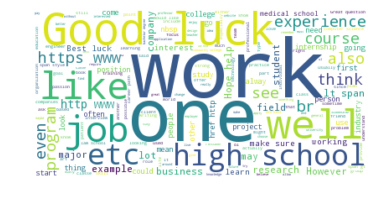

In [7]:
a_s = " ".join(title for title in a_df['answers_body'])
wordcloud = WordCloud(stopwords=stop_words, background_color="white").generate(a_s)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Step. Professionals Data

In [14]:
prof_df=pd.read_csv('./data/professionals.csv')
prof_df.info()
prof_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28152 entries, 0 to 28151
Data columns (total 5 columns):
professionals_id             28152 non-null object
professionals_location       25054 non-null object
professionals_industry       25576 non-null object
professionals_headline       26085 non-null object
professionals_date_joined    28152 non-null object
dtypes: object(5)
memory usage: 1.1+ MB


,professionals_id,professionals_location,professionals_industry,professionals_headline,professionals_date_joined
0,9ced4ce7519049c0944147afb75a8ce3,NaN,NaN,NaN,2011-10-05 20:35:19 UTC+0000
1,f718dcf6d2ec4cb0a52a9db59d7f9e67,NaN,NaN,NaN,2011-10-05 20:49:21 UTC+0000
2,0c673e046d824ec0ad0ebe012a0673e4,"New York, New York",NaN,NaN,2011-10-18 17:31:26 UTC+0000
3,977428d851b24183b223be0eb8619a8c,"Boston, Massachusetts",NaN,NaN,2011-11-09 20:39:29 UTC+0000
4,e2d57e5041a44f489288397c9904c2b2,NaN,NaN,NaN,2011-12-10 22:14:44 UTC+0000


In [15]:
prof_df = prof_df.dropna(axis=0, how='any')

In [ ]:
prof_df['professionals_industry'].describe()

In [18]:
prof_df['professionals_headline'].describe()

count     26085
unique    22272
top          --
freq        325
Name: professionals_headline, dtype: object

In [19]:
prof_df_industry=prof_df['professionals_industry'].value_counts()

In [20]:
print(prof_df_industry)

Telecommunications                                                3166
Information Technology and Services                               2109
Computer Software                                                 1272
Hospital and Health Care                                           862
Higher Education                                                   800
Accounting                                                         781
Financial Services                                                 639
Education Management                                               593
Marketing and Advertising                                          526
Internet                                                           427
Human Resources                                                    377
Mechanical or Industrial Engineering                               359
Management Consulting                                              354
Research                                                           319
Non-pr

## 4) Frequency counts of Professionals Industry, Position Title, Location

In [23]:
prof_df['professionals_date_joined'] = pd.to_numeric(prof_df['professionals_date_joined'], errors='coerce')

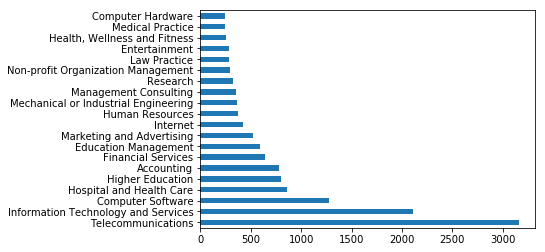

In [24]:
prof_df['professionals_industry'].value_counts()[:20].plot(kind='barh')

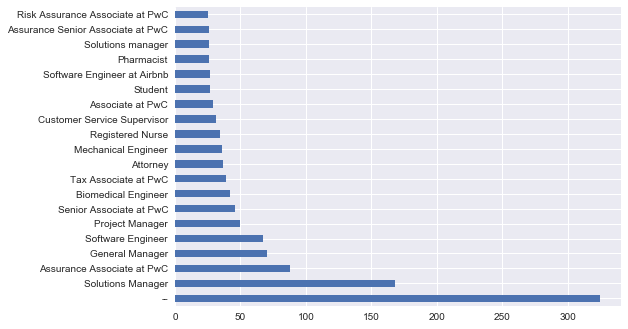

In [110]:
prof_df['professionals_headline'].value_counts()[:20].plot(kind='barh')

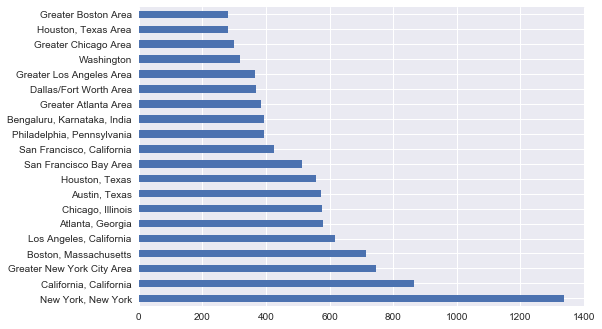

In [111]:
prof_df['professionals_location'].value_counts()[:20].plot(kind='barh')

In [16]:
prof_df['professionals_location'].value_counts()

New York, New York                               1337
California, California                            864
Greater New York City Area                        745
Boston, Massachusetts                             714
Los Angeles, California                           617
Atlanta, Georgia                                  578
Chicago, Illinois                                 576
Austin, Texas                                     574
Houston, Texas                                    556
San Francisco Bay Area                            513
San Francisco, California                         425
Philadelphia, Pennsylvania                        394
Bengaluru, Karnataka, India                       394
Greater Atlanta Area                              383
Dallas/Fort Worth Area                            368
Greater Los Angeles Area                          364
Washington                                        318
Greater Chicago Area                              298
Houston, Texas Area         

## Step. Students Data

In [16]:
stu_df=pd.read_csv('./data/students.csv')

In [17]:
stu_df = stu_df.dropna(axis=0, how='any')

## Frequency counts of Students location

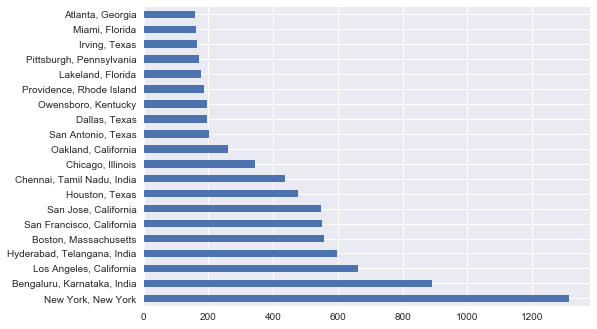

In [88]:
stu_df['students_location'].value_counts()[:20].plot(kind='barh')

In [18]:
stu_df['students_location'].value_counts()

New York, New York                       1313
Bengaluru, Karnataka, India               890
Los Angeles, California                   663
Hyderabad, Telangana, India               597
Boston, Massachusetts                     557
San Francisco, California                 550
San Jose, California                      548
Houston, Texas                            476
Chennai, Tamil Nadu, India                437
Chicago, Illinois                         344
Oakland, California                       261
San Antonio, Texas                        202
Dallas, Texas                             197
Owensboro, Kentucky                       196
Providence, Rhode Island                  187
Lakeland, Florida                         177
Pittsburgh, Pennsylvania                  170
Irving, Texas                             166
Miami, Florida                            161
Atlanta, Georgia                          160
Austin, Texas                             151
Philadelphia, Pennsylvania        

## Professionals & Students Data analysis

In [18]:
prof_df=pd.read_csv('./data/professionals.csv')
stu_df=pd.read_csv('./data/students.csv')

In [19]:
prof_df = prof_df.dropna(axis=0, how='any')
stu_df = stu_df.dropna(axis=0, how='any')

In [20]:
prof_df.head()

,professionals_id,professionals_location,professionals_industry,professionals_headline,professionals_date_joined
15,68ecc66323b8418092fdd724aaf5be94,"New York, New York",Special Events,Event Hospitality & Operations Specialist,2011-12-26 05:00:00 UTC+0000
30,c79d4e4fd9af4ab7a7e6b6f433128476,"New York, New York","education, tech, media","media, technology, education",2011-12-26 05:00:00 UTC+0000
52,1e4cc96c24344c8b806c26c3e6746167,"Boston, Massachusetts",Hospitality & Consulting,Hospitality and Restaurant Consultant,2011-12-28 14:35:42 UTC+0000
73,1ec14aee9311480681dfa81b0f193de8,"Denton, Texas",Software,Google Software Engineer,2012-01-15 19:21:07 UTC+0000
86,ccad7c94952a49b9ad0fb85b09d1398d,"New York, New York",Mobile,Co-founder of mobile fashion shopping app,2012-01-23 16:54:25 UTC+0000


In [21]:
stu_df.head()

,students_id,students_location,students_date_joined
59,9658267bc2564a85bad1e802de5fb597,"Wayne, Pennsylvania",2012-01-01 05:00:00 UTC+0000
78,d49795757f274dd690bdce3936edea20,"New York, New York",2012-01-01 05:00:00 UTC+0000
97,fae3c431698a418882c4204e5f3ee244,"Lakewood, Ohio",2012-01-01 05:00:00 UTC+0000
104,2e67080928c74a4d863b2bcc60921152,"New York, New York",2012-01-01 05:00:00 UTC+0000
111,2e7d1b7f1d474530b8114ab72686726f,"London, Ontario, Canada",2012-01-01 05:00:00 UTC+0000


In [22]:
prof_df.columns = ['professionals_id', 'location', 'professionals_industry', 'professionals_headline', 'prof_date_joined']
prof_df.head()

,professionals_id,location,professionals_industry,professionals_headline,prof_date_joined
15,68ecc66323b8418092fdd724aaf5be94,"New York, New York",Special Events,Event Hospitality & Operations Specialist,2011-12-26 05:00:00 UTC+0000
30,c79d4e4fd9af4ab7a7e6b6f433128476,"New York, New York","education, tech, media","media, technology, education",2011-12-26 05:00:00 UTC+0000
52,1e4cc96c24344c8b806c26c3e6746167,"Boston, Massachusetts",Hospitality & Consulting,Hospitality and Restaurant Consultant,2011-12-28 14:35:42 UTC+0000
73,1ec14aee9311480681dfa81b0f193de8,"Denton, Texas",Software,Google Software Engineer,2012-01-15 19:21:07 UTC+0000
86,ccad7c94952a49b9ad0fb85b09d1398d,"New York, New York",Mobile,Co-founder of mobile fashion shopping app,2012-01-23 16:54:25 UTC+0000


In [23]:
stu_df.columns = ['student_id', 'location', 'stu_date_joined']
stu_df.head()

,student_id,location,stu_date_joined
59,9658267bc2564a85bad1e802de5fb597,"Wayne, Pennsylvania",2012-01-01 05:00:00 UTC+0000
78,d49795757f274dd690bdce3936edea20,"New York, New York",2012-01-01 05:00:00 UTC+0000
97,fae3c431698a418882c4204e5f3ee244,"Lakewood, Ohio",2012-01-01 05:00:00 UTC+0000
104,2e67080928c74a4d863b2bcc60921152,"New York, New York",2012-01-01 05:00:00 UTC+0000
111,2e7d1b7f1d474530b8114ab72686726f,"London, Ontario, Canada",2012-01-01 05:00:00 UTC+0000


In [24]:
prof_stu = pd.merge(prof_df,stu_df, on ='location')
prof_stu.head()

,professionals_id,location,professionals_industry,professionals_headline,prof_date_joined,student_id,stu_date_joined
0,68ecc66323b8418092fdd724aaf5be94,"New York, New York",Special Events,Event Hospitality & Operations Specialist,2011-12-26 05:00:00 UTC+0000,d49795757f274dd690bdce3936edea20,2012-01-01 05:00:00 UTC+0000
1,68ecc66323b8418092fdd724aaf5be94,"New York, New York",Special Events,Event Hospitality & Operations Specialist,2011-12-26 05:00:00 UTC+0000,2e67080928c74a4d863b2bcc60921152,2012-01-01 05:00:00 UTC+0000
2,68ecc66323b8418092fdd724aaf5be94,"New York, New York",Special Events,Event Hospitality & Operations Specialist,2011-12-26 05:00:00 UTC+0000,ecd666a3e01f44c6b372bae05f84c942,2012-01-11 05:00:00 UTC+0000
3,68ecc66323b8418092fdd724aaf5be94,"New York, New York",Special Events,Event Hospitality & Operations Specialist,2011-12-26 05:00:00 UTC+0000,029dba32357c451386a4a285448ccf00,2012-01-11 05:00:00 UTC+0000
4,68ecc66323b8418092fdd724aaf5be94,"New York, New York",Special Events,Event Hospitality & Operations Specialist,2011-12-26 05:00:00 UTC+0000,5eed1839e60a49c495eed0834a1009a7,2012-01-11 05:00:00 UTC+0000


In [25]:
prof_stu.tail()

,professionals_id,location,professionals_industry,professionals_headline,prof_date_joined,student_id,stu_date_joined
3914488,0626a5a388904cb4b14f9b1cc4a98473,"South Holland, Illinois",Entertainment,AFO Manager,2019-01-30 15:41:16 UTC+0000,f6aa8abfa472474daa52ed9d57c327a1,2018-04-06 15:47:17 UTC+0000
3914489,0626a5a388904cb4b14f9b1cc4a98473,"South Holland, Illinois",Entertainment,AFO Manager,2019-01-30 15:41:16 UTC+0000,d86fdba5dca844ee8ee18a9e4520416f,2018-04-09 16:49:46 UTC+0000
3914490,0626a5a388904cb4b14f9b1cc4a98473,"South Holland, Illinois",Entertainment,AFO Manager,2019-01-30 15:41:16 UTC+0000,7fa2316b06934fc9bc6e10ee78b6a7d0,2018-05-27 03:48:57 UTC+0000
3914491,fcf9ae3fef164c9d8b3387dfaafd56dc,"Woodland, California",Telecom,Systems Engineer,2019-01-31 23:34:25 UTC+0000,67b6d00229264b5f9e158dc0c7f9aada,2018-03-08 05:59:54 UTC+0000
3914492,fcf9ae3fef164c9d8b3387dfaafd56dc,"Woodland, California",Telecom,Systems Engineer,2019-01-31 23:34:25 UTC+0000,e76a9eb75c41420795cb55807eec7ecf,2018-08-16 19:15:36 UTC+0000


In [79]:
prof_stu.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3914493 entries, 0 to 3914492
Data columns (total 7 columns):
professionals_id          object
location                  object
professionals_industry    object
professionals_headline    object
prof_date_joined          object
student_id                object
stu_date_joined           object
dtypes: object(7)
memory usage: 238.9+ MB


In [80]:
prof_stu['professionals_industry'].describe()

count                                 3914493
unique                                   1619
top       Information Technology and Services
freq                                   346198
Name: professionals_industry, dtype: object

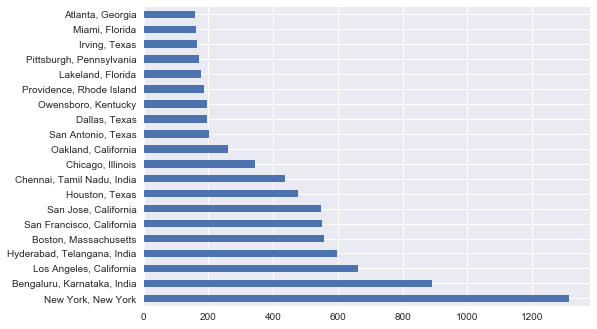

In [49]:
prof_stu['location'].value_counts()[:20].plot(kind='barh')

## NMF Topic Modelling: Answers

In [121]:
!pip install sklearn

  Running setup.py bdist_wheel for sklearn: started
  Running setup.py bdist_wheel for sklearn: finished with status 'done'
  Stored in directory: C:\Users\Rahul Raina\AppData\Local\pip\Cache\wheels\76\03\bb\589d421d27431bcd2c6da284d5f2286c8e3b2ea3cf1594c074
Successfully built sklearn


You are using pip version 9.0.1, however version 19.0.3 is available.
You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [28]:
qa_df_answers=qa_df['answers_body']
qa_df_answers.head()

0    <p>Hi!</p>\n<p>You are asking a very interesti...
1    <p>Hi. I joined the Army after I attended coll...
2    <p>Dear Priyanka,</p><p>Greetings! I have answ...
3    <p>I work for a global company who values high...
4    I agree with Denise. Every single job I've had...
Name: answers_body, dtype: object

In [5]:
import numpy as np
 
from sklearn.feature_extraction.text import TfidfVectorizer
 
from sklearn.decomposition import NMF

# convert the text to a tf-idf weighted term-document matrix
 
vectorizer = TfidfVectorizer(max_features=19000, min_df=1, stop_words='english')
 
X = vectorizer.fit_transform(qa_df['answers_body'].values.astype('U'))
 
idx_to_word = np.array(vectorizer.get_feature_names())
 
# apply NMF
 
nmf = NMF(n_components=20, solver="cd")
 
W = nmf.fit_transform(X)
 
H = nmf.components_
 
# print the topics
 
for i, topic in enumerate(H):
 
    print("Topic {}: {}".format(i + 1, ",".join([str(x) for x in idx_to_word[topic.argsort()[-10:]]])))
    

Topic 1: know,good,things,work,like,want,don,make,people,time
Topic 2: donation,org,weneedmore,provides,participate,cause,donate,fundraiser,code,nan
Topic 3: development,skills,teaching,teach,subject,em,strong,ul,ol,li
Topic 4: relate,step,suited,determine,personality,traits,various,area,important,career
Topic 5: html,watch,youtube,org,check,link,https,http,com,www
Topic 6: relaxed,background,routine,style,transparent,color,time,span,lt,gt
Topic 7: congratulations,career,demands,presents,area,step,doing,meet,strong,nbsp
Topic 8: field,skills,internships,jobs,internship,resume,company,work,experience,job
Topic 9: physics,aerospace,chemical,math,civil,electrical,engineer,engineers,mechanical,engineering
Topic 10: mba,company,economics,financial,sales,management,finance,marketing,accounting,business
Topic 11: https,hi,warmly,erinn,hey,em,helps,hope,strong,br
Topic 12: hospital,biology,med,doctor,medicine,nurse,residency,nursing,years,medical
Topic 13: transfer,classes,time,campus,colleges

## NMF Topic Modelling: Questions

In [12]:
qa_df_questions=qa_df['questions_title']
qa_df_questions.head()

0                          Teacher   career   question
1    I want to become an army officer. What can I d...
2    I want to become an army officer. What can I d...
3    Will going abroad for your first job increase ...
4    To become a specialist in business  management...
Name: questions_title, dtype: object

In [13]:
import numpy as np
 
from sklearn.feature_extraction.text import TfidfVectorizer
 
from sklearn.decomposition import NMF

# convert the text to a tf-idf weighted term-document matrix
 
vectorizer = TfidfVectorizer(max_features=19000, min_df=1, stop_words='english')
 
X = vectorizer.fit_transform(qa_df['questions_title'].values.astype('U'))
 
idx_to_word = np.array(vectorizer.get_feature_names())
 
# apply NMF
 
nmf = NMF(n_components=20, solver="cd")
 
W = nmf.fit_transform(X)
 
H = nmf.components_
 
# print the topics
 
for i, topic in enumerate(H):
 
    print("Topic {}: {}".format(i + 1, ",".join([str(x) for x in idx_to_word[topic.argsort()[-10:]]])))

Topic 1: pay,freshman,years,better,important,community,classes,going,year,college
Topic 2: help,interested,options,successful,decide,pursue,choose,did,path,career
Topic 3: nurse,look,matter,years,year,lawyer,money,long,make,does
Topic 4: science,accounting,marketing,biology,decide,psychology,choose,double,minor,major
Topic 5: years,nursing,student,prepare,classes,law,graduate,medical,high,school
Topic 6: ways,internship,prepare,pay,whats,schools,colleges,scholarships,way,best
Topic 7: help,difficult,getting,love,did,interview,opportunities,time,hard,job
Topic 8: electrical,biomedical,computer,aerospace,hard,steps,civil,mechanical,software,engineer
Topic 9: way,programs,choice,scholarships,tips,ways,teacher,idea,colleges,good
Topic 10: environmental,chemical,software,aerospace,civil,electrical,biomedical,field,mechanical,engineering
Topic 11: doctor,future,don,guide,pursue,teacher,decide,subject,lawyer,want
Topic 12: security,political,colleges,engineers,learn,difference,programming,pro

## nltk

In [137]:
!pip install nltk

You are using pip version 9.0.1, however version 19.0.3 is available.
You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [32]:
import nltk
nltk.download()
#nltk.download('punkt')

showing info https://raw.githubusercontent.com/nltk/nltk_data/gh-pages/index.xml


True

In [21]:
qa_df_answers=qa_comb['answers_body']

In [25]:
#pre-work before removing puctuation
#qa_df_answers = qa_df_answers.astype(str)

In [23]:
##removing punctuation. 
punctuation = ['.', '...', '!', '#', '"', '%', '$', "'", '&', ')', 
               '(', '+', '*', '-', ',', '/', '.', ';', ':', '=', 
               '<', '?', '>', '@', '",', '".', '[', ']', '\\', ',',
               '_', '^', '`', '{', '}', '|', '~', '−', '”', '“', '’']


# remove ponctuation
for i,doc in enumerate(qa_df_answers): 
    for punc in punctuation: 
        doc = doc.replace(punc, ' ')
    qa_df_answers[i] = doc
    
print(qa_df_answers[0][:1000])

 p Hi   p 
 p You are asking a very interesting question   I am giving you two sites that will give you some of an explanation that may answer your question   p 
 p http   mathforum org dr math faq faq why math html  p 
 p http   www mathworksheetscenter com mathtips mathissoimportant html  p 
 p Let me know if this helps  p 


In [26]:
qa_df_answers=qa_comb['answers_body'].to_string(index=False)

In [46]:
#nltk package
# Import necessary modules
from nltk.tokenize import sent_tokenize
from nltk.tokenize import word_tokenize

# Split into sentences: sentences
tokenized_answers_body=sent_tokenize(qa_df_answers)

# Make a set of unique tokens in the entire answers_body: unique_tokens
unique_tokens = set(word_tokenize(qa_df_answers))

# Print the unique tokens result
print(unique_tokens)

{'initiati', '\\n\\nDropping', 'metho', '6months', 'subspecialty', 'ypu', 'brave', '\\n\\nYou', 'Larissa', 'bulle', 'Behavioral', 'camp', '大学本科的专业细分还没有细致到计算机网络的地步，等到读研的时候，计算机网络可以作为你的方向。', 'Albany', 'Inves', 'Elaine', 'weapons', '1.Do', 'PD', 'aeronautical', 'Francy', 'joi', 'Ball', 'tends', 'Jobs.\\nChild', 'Opt', 'Fei', '\\n\\nGiving', 'Lindsey', 'respon', 'confronta', 'style', 'M.D.-Ph.D.', 'ma', 'Liberal', '1.What', 'anatomy', 'NCRC', 'Challenging', 'definitive', 'Robyn', 'Amy-', 'sitting', 'Rainer', 'finishing', 'Airline', 'KP', 'Ins', '\\n-Have', 'toge', 'grad-student', 'Doris', '19', 'Bask', 'Liana', 'Splendid', 'Diploma', 'postings', 'adequate', 'Gus', 'Have', 'www.asianheartinstitute.org', 'enjoyi', 'Women', 'regard', 'Cosm', 'Nishaath', '//www.f', 'Illustrator', 'wea', 'Katelyn', 'effectivel', 'Ariel', 'Degre', 'arm', 'quota', 'OIL', 'Tons', 'speed', 'fake', 'Fun', 'Damyon', 'league', 'question.\\nA', 'Marcella', 'Acoustic', 'intent', 'basics', 'willing', 'Network', 'Far', 'jo

In [63]:
from nltk.tokenize import sent_tokenize

# Split into sentences: sentences
tokenized_answers_body=sent_tokenize(qa_df_answers)
print(tokenized_answers_body)

['<p>Hi!</p>\\n<p>You are asking a very interesti...\n<p>Hi.', 'I joined the Army after I attended coll...\n<p>Dear Priyanka,</p><p>Greetings!', 'I have answ...\n<p>I work for a global company who values high...', 'I agree with Denise.', "Every single job I've had...\nNetworking is a key component to progressing y...\nhttps://www.unigo.com/\\n\\nCheck out this websi...\n<p>Hi Jocelyn ,</p><p><br></p><p>May I recomme...\n<p>For the typical schedule it takes four year...\nOf course!", 'I know someone who doubled in class...\nSure!\\nMusic Therapy .', 'Actually I am learning...\n<p>Hi Rodrigo!</p>\\n<p>The important thing to ...\n<p>If you like doing creative work, graphic de...\nHi Torrey,\\n\\nwhen I went to school at univers...\n<html><head></head><body><p>Hi Deja,</p>\\n<p>K...\n<ul>\\n<li>\\n<p>4 years of college</p>\\n</li>\\n...\n<p>Hey Megan.', 'You are looking at a great field...\n<p>Gender differences in access to economic op...\n<p>It all depends on what type of job you have...

In [81]:
#Eliminating stopwords
from nltk.corpus import stopwords
stop_words=set(stopwords.words("english"))
print(stop_words)

filtered_sent=[]
for w in tokenized_answers_body:
    if w not in stop_words:
        filtered_sent.append(w)
print("Tokenized Sentence:",tokenized_answers_body)
print("Filterd Sentence:",filtered_sent)

{'too', 'be', 'by', 'from', 'on', 'below', 'm', 'and', 'out', 'about', 'mustn', "don't", 'y', 'your', 'through', 'these', 'under', "mightn't", 'should', 'few', 'we', "didn't", 'hasn', 'needn', "hasn't", 'as', 'just', 'it', "needn't", 'a', 'most', 'they', 'couldn', 'the', 'his', 'our', 'own', "weren't", 'am', 'was', 'but', 'of', 'weren', 'yourselves', "shan't", "hadn't", 'any', 'at', 'over', 'can', 'them', 'has', "wouldn't", 'why', 'won', 'no', 'other', 'between', 'above', 'me', 'herself', 'there', 'wasn', 'will', 'their', 'were', 'shouldn', 'such', 'to', 'or', 'who', 've', 's', 'she', 'yours', 'whom', 'isn', 'are', 'being', 'with', 'yourself', "it's", 'hers', 'now', 'once', 'didn', "couldn't", 'up', 'in', 'wouldn', 'i', 'only', 'been', 'you', 'my', "won't", 'those', 'having', 'o', 'ain', 'more', 'is', 'both', 'themselves', "wasn't", "isn't", 'shan', "you're", 'what', 'haven', 'have', 'does', 'himself', 'did', "that'll", 'nor', 'so', 'during', "should've", 'doesn', 'hadn', 'same', "you'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [51]:
##removing punctuation for tokenized_answers_body
#punctuation = ['.', '...', '!', '#', '"', '%', '$', "'", '&', ')', '!'
      #         '(', '+', '*', '-', ',', '/', '.', ';', ':', '=', 
            #   '<', '?', '>', '@', '",', '".', '[', ']', '\\', ',',
            #   '_', '^', '`', '{', '}', '|', '~', '−', '”', '“', '’']

# remove ponctuation
#for i,doc in enumerate(tokenized_answers_body): 
 #   for punc in punctuation: 
  #      doc = doc.replace(punc, ' ')
   # tokenized_answers_body[i] = doc
    
#print(tokenized_answers_body[0][:1000])

In [58]:
#Eliminating nonvalue words from tokenized_answers_body
nonvalue_words = ['question', '.', 'yes', 'absolutely', 'good', 'Absolutely', 
                  'T...', 'Seriously','Wow!','Interesting', 'Great', 'S...']
             

for i,doc in enumerate(tokenized_answers_body): 
    for non in nonvalue_words: 
        doc = doc.replace(non, ' ')
    tokenized_answers_body[i] = doc
    
print(tokenized_answers_body[0][:1000])

<p>Hi!</p>\n<p>You are asking a very interesti   
<p>Hi 


In [53]:
filtered_sent=[]
for w in tokenized_answers_body:
    if w not in nonvalue_words:
        filtered_sent.append(w)

In [54]:
print("Filterd:",filtered_sent)

Filterd: ['<p>Hi!</p>\\n<p>You are asking a very interesti...\n<p>Hi.', 'I joined the Army after I attended coll...\n<p>Dear Priyanka,</p><p>Greetings!', 'I have answ...\n<p>I work for a global company who values high...', 'I agree with Denise.', "Every single job I've had...\nNetworking is a key component to progressing y...\nhttps://www.unigo.com/\\n\\nCheck out this websi...\n<p>Hi Jocelyn ,</p><p><br></p><p>May I recomme...\n<p>For the typical schedule it takes four year...\nOf course!", 'I know someone who doubled in class...\nSure!\\nMusic Therapy .', 'Actually I am learning...\n<p>Hi Rodrigo!</p>\\n<p>The important thing to ...\n<p>If you like doing creative work, graphic de...\nHi Torrey,\\n\\nwhen I went to school at univers...\n<html><head></head><body><p>Hi Deja,</p>\\n<p>K...\n<ul>\\n<li>\\n<p>4 years of college</p>\\n</li>\\n...\n<p>Hey Megan.', 'You are looking at a great field...\n<p>Gender differences in access to economic op...\n<p>It all depends on what type of job yo

In [64]:
#Frequency Distribution
from nltk.book import FreqDist

fdist1 = FreqDist(tokenized_answers_body) 
print(fdist1) 
fdist1.most_common(20) 

<FreqDist with 12843 samples and 13107 outcomes>


[('Great question.', 51),
 ('...', 28),
 ('Great question!', 24),
 ('This is a great question.', 17),
 ('.', 16),
 ('Yes.', 12),
 ('Absolutely.', 10),
 ('Practice.', 9),
 ('Yes!', 8),
 ('Good question!', 7),
 ('Good question.', 7),
 ('This is a great question!', 6),
 ('Absolutely!', 6),
 ('T...', 6),
 ('Seriously.', 5),
 ('Wow!', 4),
 ('Interesting question!', 4),
 ('What do you do well?', 4),
 ('S...', 3),
 ('Thanks for submitting a question.', 3)]

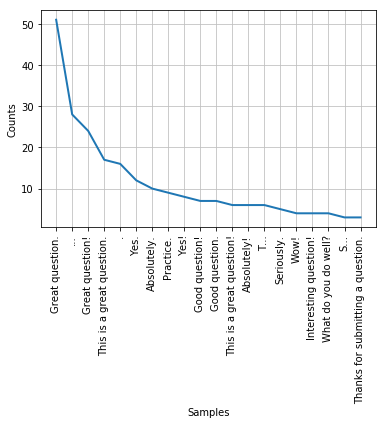

In [65]:
#Frequency distribution pre-work
fdist1.plot(20, cumulative=False)
plt.show()

In [22]:
#Collocations & Bigrams
#A collocation is a sequence of words that occur together unusually often. 
#Thus red wine is a collocation, whereas the wine is not. To get a handle on collocations, 
#we start off by extracting from a text a list of word pairs, also known as bigrams. 
from nltk import bigrams
list(bigrams(tokenized_answers_body))


[(' p Hi   p  n p You are asking a very interesti   \n p Hi ',
  'I joined the Army after I attended coll   \n p Dear Priyanka   p  p Greetings '),
 ('I joined the Army after I attended coll   \n p Dear Priyanka   p  p Greetings ',
  'I have answ   \n p I work for a global company who values high   '),
 ('I have answ   \n p I work for a global company who values high   ',
  'I agree with Denise '),
 ('I agree with Denise ',
  'Every single job I ve had   \nNetworking is a key component to progressing y   \nhttps   www unigo com  n nCheck out this websi   \n p Hi Jocelyn    p  p  br   p  p May I recomme   \n p For the typical schedule it takes four year   \nOf course '),
 ('Every single job I ve had   \nNetworking is a key component to progressing y   \nhttps   www unigo com  n nCheck out this websi   \n p Hi Jocelyn    p  p  br   p  p May I recomme   \n p For the typical schedule it takes four year   \nOf course ',
  'I know someone who doubled in class   \nSure  nMusic Therapy  '),
 (

In [28]:
tokenized_answers_body_big = list(bigrams(tokenized_answers_body))

## Bags of words Model

In [41]:
qa_df_questions=qa_df['questions_body']

In [42]:
qa_df_questions=qa_df['questions_body'].to_string(index=False)

In [53]:
#bags of words: extracting features from the text

# Import Counter
from collections import Counter

# Tokenize the article: tokens
tokens = word_tokenize(qa_df_questions)

# Convert the tokens into lowercase: lower_tokens
lower_tokens = [t.lower() for t in tokens]

# Create a Counter with the lowercase tokens: bow_simple
bow_simple = Counter(lower_tokens)

# Print the 10 most common tokens
print(bow_simple.most_common(10))


[('i', 51152), ('...', 48206), ('to', 21319), ('a', 20166), ('#', 15219), ('in', 14352), ('am', 13904), ('and', 11448), (',', 8904), ('want', 7780)]


In [60]:
#Text preprocessing practice remove stop words and non-alphabetic characters, lemmatize, and perform a new bag-of-words on 
#your cleaned text.
# Import WordNetLemmatizer
from nltk.stem import WordNetLemmatizer

# Retain alphabetic words: alpha_only
alpha_only = [t for t in lower_tokens if t.isalpha()]


# Create the bag-of-words: bow
bow = Counter(alpha_only)

# Print the 10 most common tokens
print(bow.most_common(300))


[('i', 51152), ('to', 21319), ('a', 20166), ('in', 14352), ('am', 13904), ('and', 11448), ('want', 7780), ('the', 6748), ('my', 6369), ('is', 5221), ('school', 4942), ('have', 4777), ('be', 4645), ('of', 4414), ('college', 4298), ('what', 3913), ('high', 3887), ('know', 3809), ('for', 3703), ('do', 2976), ('interested', 2925), ('an', 2890), ('this', 2826), ('but', 2805), ('that', 2783), ('like', 2606), ('would', 2567), ('because', 2556), ('it', 2382), ('about', 2228), ('on', 2033), ('career', 2030), ('are', 2014), ('p', 1976), ('student', 1867), ('as', 1860), ('you', 1838), ('at', 1829), ('major', 1791), ('how', 1769), ('become', 1688), ('asking', 1653), ('currently', 1610), ('if', 1553), ('going', 1539), ('hi', 1484), ('was', 1473), ('go', 1469), ('senior', 1462), ('been', 1420), ('really', 1411), ('not', 1409), ('with', 1385), ('get', 1329), ('love', 1304), ('into', 1297), ('junior', 1266), ('question', 1204), ('so', 1197), ('will', 1181), ('just', 1165), ('can', 1145), ('looking', 1

## Step Combine Questions Tags & Questions id data

In [9]:
tag_df = pd.read_csv('./data/tags.csv')
tagq_df = pd.read_csv('./data/tag_questions.csv')

In [10]:
tag_df = tag_df.dropna(axis=0, how='any')
tagq_df = tagq_df.dropna(axis=0, how='any')

In [11]:
tag_df.head()

,tags_tag_id,tags_tag_name
0,27490,college
1,461,computer-science
2,593,computer-software
3,27292,business
4,18217,doctor


In [12]:
tagq_df.head()

,tag_questions_tag_id,tag_questions_question_id
0,28930,cb43ebee01364c68ac61d347a393ae39
1,28930,47f55e85ce944242a5a347ab85a8ffb4
2,28930,ccc30a033a0f4dfdb2eb987012f25792
3,28930,e30b274e48d741f7bf50eb5e7171a3c0
4,28930,3d22742052df4989b311b4195cbb0f1a


In [13]:
tag_df.columns = ['tag_id', 'tag_name']
tag_df.head()

,tag_id,tag_name
0,27490,college
1,461,computer-science
2,593,computer-software
3,27292,business
4,18217,doctor


In [14]:
tagq_df.columns = ['tag_id', 'tag_question_id']
tagq_df.head()

,tag_id,tag_question_id
0,28930,cb43ebee01364c68ac61d347a393ae39
1,28930,47f55e85ce944242a5a347ab85a8ffb4
2,28930,ccc30a033a0f4dfdb2eb987012f25792
3,28930,e30b274e48d741f7bf50eb5e7171a3c0
4,28930,3d22742052df4989b311b4195cbb0f1a


In [15]:
tag_comb = pd.merge(tag_df,tagq_df, on ='tag_id')
tag_comb.head()

,tag_id,tag_name,tag_question_id
0,27490,college,bfbf79503bfb48909b4e514c5675502e
1,27490,college,a4da117f4e3b45d49b83f7c3d6bc9915
2,27490,college,9b90fda0660e4b72936c17a642334929
3,27490,college,37a7d709c90445fc9643ada3933fbc6d
4,27490,college,bc854d4070dd474797ff5f0242f510f1


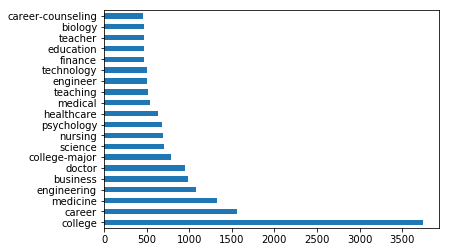

In [16]:
tag_comb['tag_name'].value_counts()[:20].plot(kind='barh')

## Combining professional/student & tag datasets

In [26]:
tag_prof = pd.merge(prof_stu,tag_comb, left_on = 'professionals_id', right_on = 'tag_question_id', how='outer')

In [27]:
tag_prof.head()

,professionals_id,location,professionals_industry,professionals_headline,prof_date_joined,student_id,stu_date_joined,tag_id,tag_name,tag_question_id
0,68ecc66323b8418092fdd724aaf5be94,"New York, New York",Special Events,Event Hospitality & Operations Specialist,2011-12-26 05:00:00 UTC+0000,d49795757f274dd690bdce3936edea20,2012-01-01 05:00:00 UTC+0000,NaN,NaN,NaN
1,68ecc66323b8418092fdd724aaf5be94,"New York, New York",Special Events,Event Hospitality & Operations Specialist,2011-12-26 05:00:00 UTC+0000,2e67080928c74a4d863b2bcc60921152,2012-01-01 05:00:00 UTC+0000,NaN,NaN,NaN
2,68ecc66323b8418092fdd724aaf5be94,"New York, New York",Special Events,Event Hospitality & Operations Specialist,2011-12-26 05:00:00 UTC+0000,ecd666a3e01f44c6b372bae05f84c942,2012-01-11 05:00:00 UTC+0000,NaN,NaN,NaN
3,68ecc66323b8418092fdd724aaf5be94,"New York, New York",Special Events,Event Hospitality & Operations Specialist,2011-12-26 05:00:00 UTC+0000,029dba32357c451386a4a285448ccf00,2012-01-11 05:00:00 UTC+0000,NaN,NaN,NaN
4,68ecc66323b8418092fdd724aaf5be94,"New York, New York",Special Events,Event Hospitality & Operations Specialist,2011-12-26 05:00:00 UTC+0000,5eed1839e60a49c495eed0834a1009a7,2012-01-11 05:00:00 UTC+0000,NaN,NaN,NaN


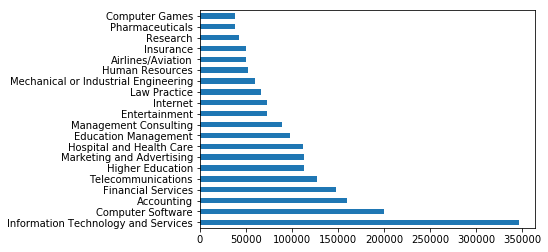

In [24]:
tag_prof['professionals_industry'].value_counts()[:20].plot(kind='barh')

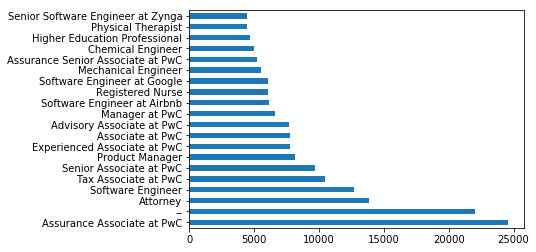

In [25]:
tag_prof['professionals_headline'].value_counts()[:20].plot(kind='barh')

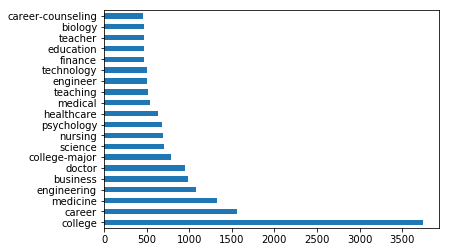

In [22]:
tag_comb['tag_name'].value_counts()[:20].plot(kind='barh')

In [28]:
tags_text =tag_comb['tag_name']

In [27]:
tags_text

0                    college
1                    college
2                    college
3                    college
4                    college
5                    college
6                    college
7                    college
8                    college
9                    college
10                   college
11                   college
12                   college
13                   college
14                   college
15                   college
16                   college
17                   college
18                   college
19                   college
20                   college
21                   college
22                   college
23                   college
24                   college
25                   college
26                   college
27                   college
28                   college
29                   college
                ...         
76523    writing-and-editing
76524    writing-and-editing
76525    writing-and-editing
76526    writi

## Building MATCH (predictive algorithm) to match a question to a volunteer career counsellor: Gensim Word2vec

In [2]:
!pip install tensorflow

  Stored in directory: C:\Users\Rahul Raina\AppData\Local\pip\Cache\wheels\7c\06\54\bc84598ba1daf8f970247f550b175aaaee85f68b4b0c5ab2c6
  Stored in directory: C:\Users\Rahul Raina\AppData\Local\pip\Cache\wheels\ee\98\38\46cbcc5a93cfea5492d19c38562691ddb23b940176c14f7b48
  Stored in directory: C:\Users\Rahul Raina\AppData\Local\pip\Cache\wheels\5c\2e\7e\a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built termcolor absl-py gast


markdown 3.1 has requirement setuptools>=36, but you'll have setuptools 27.2.0 which is incompatible.
You are using pip version 19.0.3, however version 19.1.1 is available.
You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [36]:
#!pip install -U gensim

Requirement already up-to-date: gensim in c:\anaconda3\lib\site-packages (3.7.2)


In [30]:
#!python -m pip install --upgrade pip

  Found existing installation: pip 9.0.1
    Uninstalling pip-9.0.1:
      Successfully uninstalled pip-9.0.1


In [5]:
from gensim.models import word2vec

In [29]:
word2vec_model = gensim.models.Word2Vec([tags_text],min_count=1,size=32)

In [54]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
%matplotlib inline

In [55]:
def tsne_plot(word2vec_model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in word2vec_model.wv.vocab:
        tokens.append(word2vec_model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  import sys


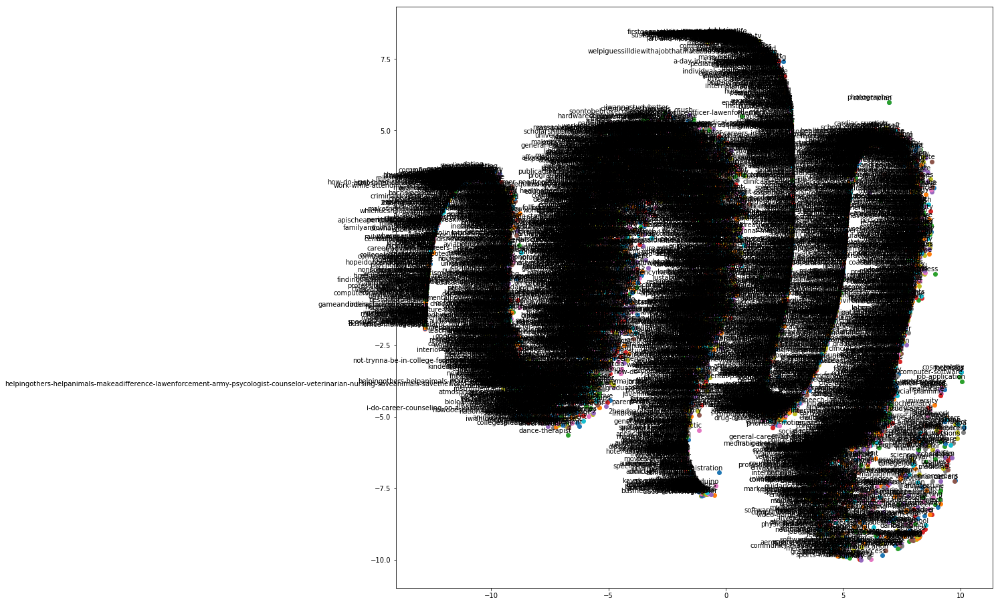

In [56]:
tsne_plot(word2vec_model)

In [68]:
model = word2vec.Word2Vec([tags_text], size=80, window=20, min_count=100, workers=4)

C:\Anaconda3\lib\site-packages\gensim\models\base_any2vec.py:743: UserWarning: C extension not loaded, training will be slow. Install a C compiler and reinstall gensim for fast training.
  "C extension not loaded, training will be slow. "


C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  import sys


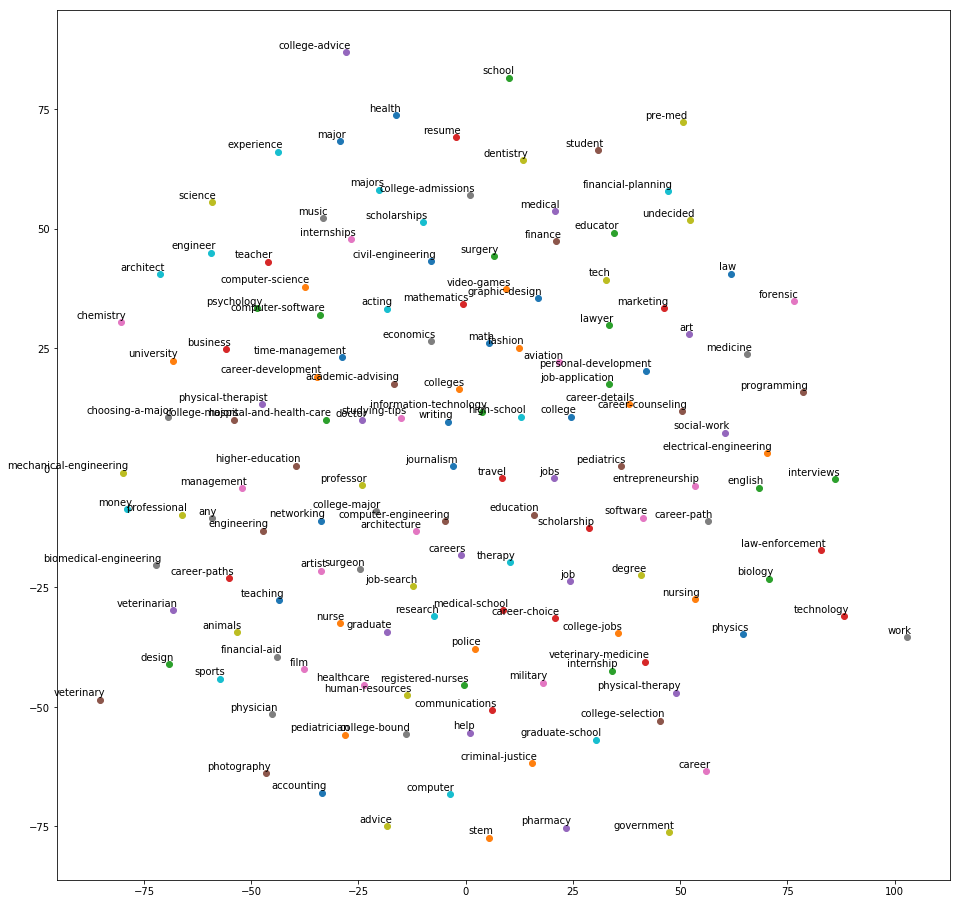

In [69]:
tsne_plot(model)

## Word2Vec Dashboard: visualize embeddings 

In [11]:
!pip install tensorflow-gpu==1.13.1

ERROR: Could not install packages due to an EnvironmentError: [WinError 5] Access is denied: 'C:\\Anaconda3\\envs\\tensorflowsessions\\Lib\\site-packages\\tensorflow\\python\\_pywrap_tensorflow_internal.pyd'
Consider using the `--user` option or check the permissions.



In [2]:
#import tensorflow as tf

In [3]:
import tensorflow as tf
from tensorflow.contrib.tensorboard.plugins import projector
import numpy as np
import gensim

import warnings
warnings.filterwarnings(action='ignore', category=UserWarning, module='gensim')

C:\Anaconda3\lib\site-packages\h5py\__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
C:\Anaconda3\lib\site-packages\smart_open\ssh.py:34: UserWarning: paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress
  warnings.warn('paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress')


In [33]:
max_size = len(word2vec_model.wv.vocab)-1

In [35]:
w2v = np.zeros((max_size,word2vec_model.layer1_size))

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `layer1_size` (Attribute will be removed in 4.0.0, use self.trainables.layer1_size instead).
  """Entry point for launching an IPython kernel.


In [36]:
w2v

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [39]:
with open("metadata.tsv", 'w+') as file_metadata:
    for i,word in enumerate(word2vec_model.wv.index2word[:max_size]):
        w2v[i] = word2vec_model.wv[word]
        file_metadata.write(word + '\n')

In [40]:
w2v

array([[-5.35394728e-01,  8.27641040e-02,  2.77981210e+00, ...,
         4.04054689e+00, -1.59222186e+00, -2.86386824e+00],
       [ 7.83308864e-01,  1.41679227e-01,  1.30761731e+00, ...,
         5.90490520e-01, -2.90851951e-01, -1.40508711e+00],
       [-1.13541996e+00,  6.30375862e-01, -8.35117102e-02, ...,
         1.43549311e+00,  7.69928038e-01, -3.41381836e+00],
       ...,
       [-3.56062055e-02, -9.38767940e-02,  1.58538416e-01, ...,
         1.47216782e-01,  3.96104604e-02, -1.30519763e-01],
       [-2.12320667e-02, -8.24262276e-02,  1.74283803e-01, ...,
         1.45698458e-01,  3.46697606e-02, -1.46509066e-01],
       [-1.86723692e-03, -8.29372928e-02,  1.30255640e-01, ...,
         1.32521257e-01,  2.03816928e-02, -1.09695487e-01]])

In [41]:
sess = tf.InteractiveSession()

In [42]:
with tf.device("/cpu:0"):
    embedding = tf.Variable(w2v, trainable=False, name='embedding')

Instructions for updating:
Colocations handled automatically by placer.


In [43]:
tf.global_variables_initializer().run()

In [44]:
path = 'tensorboard'

In [45]:
saver = tf.train.Saver()

In [46]:
writer = tf.summary.FileWriter(path, sess.graph)

In [47]:
config = projector.ProjectorConfig()
embed = config.embeddings.add()
embed.tensor_name = 'embedding'
embed.metadata_path = 'metadata.tsv'

In [48]:
projector.visualize_embeddings(writer, config)

saver.save(sess, path+'/model.ckpt', global_step=max_size)

'tensorboard/model.ckpt-7090'

## MATCH (predictive algorithm to match a question to a volunteer career counsellor based on the volunteer's industry affiliation): Part 1. using Word2Vec

In [82]:
model.most_similar('engineering')

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('career-paths', 0.4874300956726074),
 ('veterinarian', 0.47735586762428284),
 ('higher-education', 0.456102192401886),
 ('management', 0.4497598707675934),
 ('social-work', 0.4380388855934143),
 ('research', 0.43073973059654236),
 ('job-search', 0.42782264947891235),
 ('experience', 0.4251953661441803),
 ('veterinary', 0.42296281456947327),
 ('education', 0.42282071709632874)]

In [59]:
word2vec_model.most_similar('engineering')

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('marketing', 0.7665660381317139),
 ('physical-therapy', 0.7656248807907104),
 ('game-development', 0.735833466053009),
 ('cardiopulmonary', 0.7342476844787598),
 ('salary', 0.7298018932342529),
 ('investment-management', 0.7277902364730835),
 ('mental-health', 0.7226481437683105),
 ('mathematics', 0.722200870513916),
 ('coaching', 0.7221202254295349),
 ('personal-finance', 0.7183225154876709)]

In [70]:
eng = word2vec_model.most_similar('engineering')

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


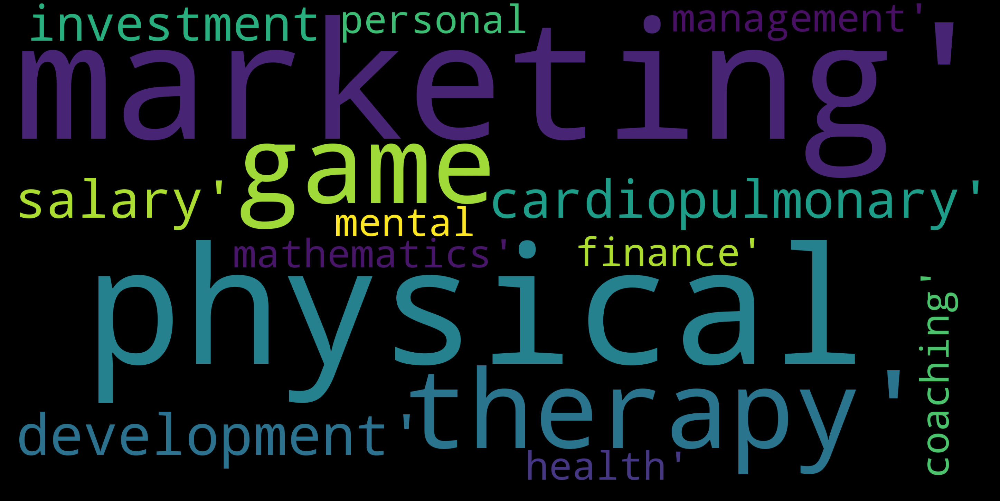

In [148]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

text = eng

wordcloud = WordCloud(
    width = 3000,
    height = 1500,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))

fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')

plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [72]:
eng_df = pd.DataFrame(eng, columns=['recommended_question_topic', 'compatibility'])

In [131]:
eng_df

,recommended_question_topic,compatibility
0,marketing,0.766566
1,physical-therapy,0.765625
2,game-development,0.735833
3,cardiopulmonary,0.734248
4,salary,0.729802
5,investment-management,0.727790
6,mental-health,0.722648
7,mathematics,0.722201
8,coaching,0.722120
9,personal-finance,0.718323


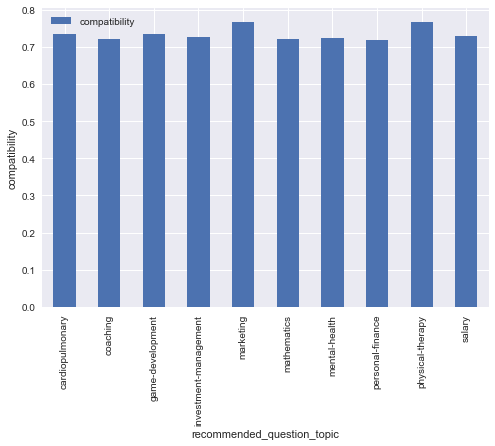

In [135]:
import matplotlib.pyplot as plt
import seaborn as sns
# use Seaborn styles
sns.set()
pd.pivot_table(eng_df, index= 'recommended_question_topic', values= "compatibility").plot(kind= 'bar')
plt.ylabel("compatibility")

In [136]:
aca = word2vec_model.most_similar('academia')

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


In [137]:
aca_df = pd.DataFrame(aca, columns=['recommended_question_topic', 'compatibility'])

In [138]:
aca_df

,recommended_question_topic,compatibility
0,soft-skills,0.998825
1,property-management,0.998824
2,essays,0.998820
3,cartoon,0.998809
4,boston-sports,0.998806
5,smithsonian,0.998802
6,ged,0.998789
7,international-development,0.998769
8,overseas,0.998755
9,broker,0.998746


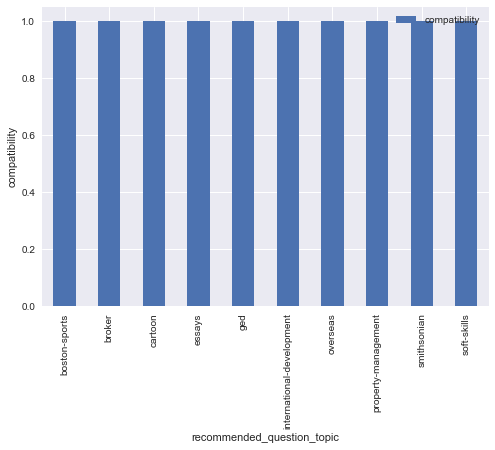

In [139]:
sns.set()
pd.pivot_table(aca_df, index= 'recommended_question_topic', values= "compatibility").plot(kind= 'bar')
plt.ylabel("compatibility")

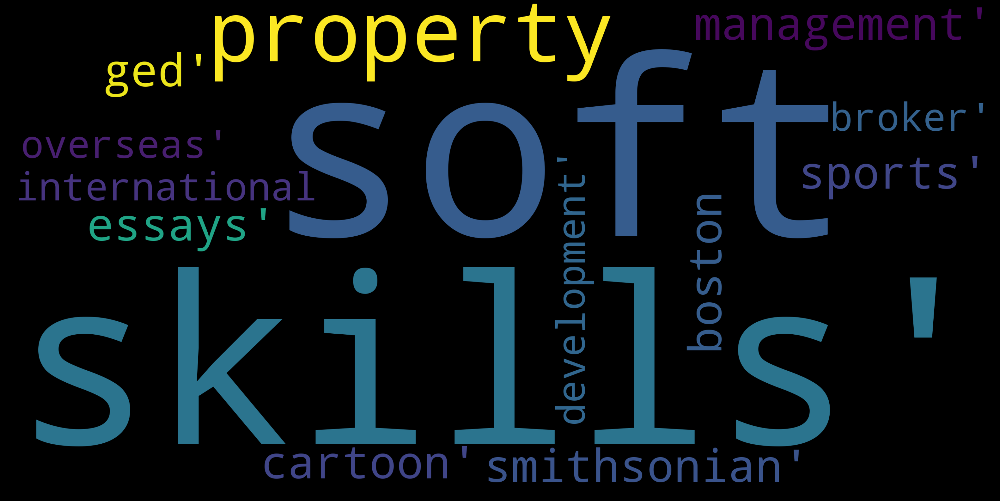

In [147]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

text = aca

wordcloud = WordCloud(
    width = 3000,
    height = 1500,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))

fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')

plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [140]:
doc = word2vec_model.most_similar('doctor')

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


In [142]:
doc_df = pd.DataFrame(doc, columns=['recommended_question_topic', 'compatibility'])

In [143]:
doc_df

,recommended_question_topic,compatibility
0,health,0.782833
1,writing,0.742051
2,sports-marketing,0.731305
3,public-health,0.725178
4,ivy-league,0.720938
5,undecided,0.718066
6,commerce,0.715890
7,spanish,0.714689
8,firstgenration,0.712452
9,mec,0.712431


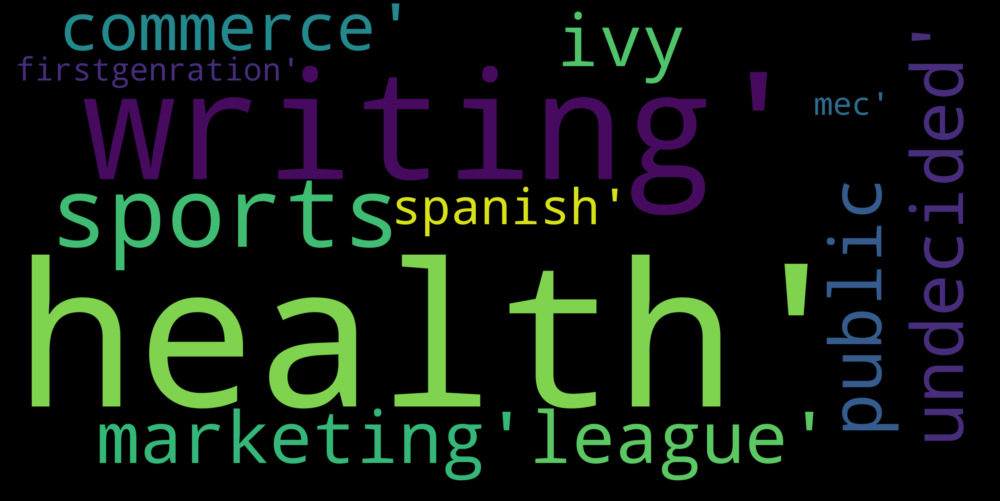

In [146]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

text = doc

wordcloud = WordCloud(
    width = 3000,
    height = 1500,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))

fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')

plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [98]:
import multiprocessing

from gensim.models import Word2Vec

In [117]:
w2v_model = Word2Vec(min_count=20,
                     window=2,
                     size=300,
                     sample=6e-5, 
                     alpha=0.03, 
                     min_alpha=0.0007, 
                     negative=20,
                     workers=4)

C:\Anaconda3\lib\site-packages\gensim\models\base_any2vec.py:743: UserWarning: C extension not loaded, training will be slow. Install a C compiler and reinstall gensim for fast training.
  "C extension not loaded, training will be slow. "


In [149]:
#w2v_model.build_vocab(tags_text, progress_per=10000)

In [119]:
w2v_model.train(tags_text, total_examples=w2v_model.corpus_count, epochs=30, report_delay=1)

(328201, 2296590)

In [120]:
w2v_model.init_sims(replace=True)

In [150]:
#w2v_model.wv.most_similar(positive=['enigneering'])

In [100]:
#w2v_model = word2vec.Word2Vec([tags_text], size=80, window=20, min_count=100, workers=4)

C:\Anaconda3\lib\site-packages\gensim\models\base_any2vec.py:743: UserWarning: C extension not loaded, training will be slow. Install a C compiler and reinstall gensim for fast training.
  "C extension not loaded, training will be slow. "


In [101]:
#w2v_model.wv.most_similar(positive=["engineering"])

[('career-paths', 0.4874300956726074),
 ('veterinarian', 0.47735586762428284),
 ('higher-education', 0.456102192401886),
 ('management', 0.4497598707675934),
 ('social-work', 0.4380388855934143),
 ('research', 0.43073973059654236),
 ('job-search', 0.42782264947891235),
 ('experience', 0.4251953661441803),
 ('veterinary', 0.42296281456947327),
 ('education', 0.42282071709632874)]

## MATCH part 2: similiarity measure, using Doc2vec

In [3]:
!ls data

answer_scores.csv
answers.csv
comments.csv
emails.csv
group_memberships.csv
groups.csv
matches.csv
professionals.csv
question_scores.csv
questions.csv
school_memberships.csv
students.csv
tag_questions.csv
tag_users.csv
tags.csv


In [5]:
import pandas as pd
tag_users = pd.read_csv('data/tag_users.csv')
tag_users.head(5)

,tag_users_tag_id,tag_users_user_id
0,593,c72ab38e073246e88da7e9a4ec7a4472
1,1642,8db519781ec24f2e8bdc67c2ac53f614
2,638,042d2184ee3e4e548fc3589baaa69caf
3,11093,c660bd0dc1b34224be78a58aa5a84a63
4,21539,8ce1dca4e94240239e4385ed22ef43ce


In [6]:
tags = pd.read_csv('data/tags.csv')
tags.head(5)

,tags_tag_id,tags_tag_name
0,27490,college
1,461,computer-science
2,593,computer-software
3,27292,business
4,18217,doctor


In [7]:
tag_users_tags = tag_users.merge(right=tags, how='inner', left_on='tag_users_tag_id', right_on='tags_tag_id')
tag_users_tags.head(5)

,tag_users_tag_id,tag_users_user_id,tags_tag_id,tags_tag_name
0,593,c72ab38e073246e88da7e9a4ec7a4472,593,computer-software
1,593,8db519781ec24f2e8bdc67c2ac53f614,593,computer-software
2,593,9ab6b54d55b24299a4795584508db4ff,593,computer-software
3,593,e327399c48584fcf81e433828a6d8715,593,computer-software
4,593,92494d9dc2124507972c5306badc6727,593,computer-software


In [8]:
answers = pd.read_csv('data/answers.csv')
answers.head(5)

,answers_id,answers_author_id,answers_question_id,answers_date_added,answers_body
0,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,332a511f1569444485cf7a7a556a5e54,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...
1,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,eb80205482e4424cad8f16bc25aa2d9c,2018-05-01 14:19:08 UTC+0000,<p>Hi. I joined the Army after I attended coll...
2,eaa66ef919bc408ab5296237440e323f,cbd8f30613a849bf918aed5c010340be,eb80205482e4424cad8f16bc25aa2d9c,2018-05-02 02:41:02 UTC+0000,"<p>Dear Priyanka,</p><p>Greetings! I have answ..."
3,1a6b3749d391486c9e371fbd1e605014,7e72a630c303442ba92ff00e8ea451df,4ec31632938a40b98909416bdd0decff,2017-05-10 19:00:47 UTC+0000,<p>I work for a global company who values high...
4,5229c514000446d582050f89ebd4e184,17802d94699140b0a0d2995f30c034c6,2f6a9a99d9b24e5baa50d40d0ba50a75,2017-10-13 22:07:33 UTC+0000,I agree with Denise. Every single job I've had...


In [9]:
tag_users_answers = tag_users_tags.merge(right=answers, how='inner', left_on='tag_users_user_id', right_on='answers_author_id')
tag_users_answers.head(5)

,tag_users_tag_id,tag_users_user_id,tags_tag_id,tags_tag_name,answers_id,answers_author_id,answers_question_id,answers_date_added,answers_body
0,593,c72ab38e073246e88da7e9a4ec7a4472,593,computer-software,205e0786473740edb7e7f1a4a2996ef5,c72ab38e073246e88da7e9a4ec7a4472,f42126d1f5994134af30fa56703fde52,2014-02-21 20:27:13 UTC+0000,<p>I am sure there are many majors that are av...
1,593,c72ab38e073246e88da7e9a4ec7a4472,593,computer-software,14d84e768c3649298293e7cdedf57532,c72ab38e073246e88da7e9a4ec7a4472,e77a8497a08449178daf4818c0b15c72,2014-02-21 18:06:43 UTC+0000,<p>I think there are two different kind of way...
2,593,c72ab38e073246e88da7e9a4ec7a4472,593,computer-software,f6ab9b1bea0f45249f189fc527d06bb9,c72ab38e073246e88da7e9a4ec7a4472,a7ca0e7261424526b29fada7f5323f70,2014-02-21 18:00:41 UTC+0000,<p>Absolutely! You're right that it is recomme...
3,593,c72ab38e073246e88da7e9a4ec7a4472,593,computer-software,6bcd275da9094c34963adbb8c3cd5f31,c72ab38e073246e88da7e9a4ec7a4472,d38df3a496df447b981fa23d51db224b,2014-02-21 20:19:04 UTC+0000,<p>I think Computer Science is a program which...
4,593,c72ab38e073246e88da7e9a4ec7a4472,593,computer-software,a132e8b5fae0493d90d428b11b4b314e,c72ab38e073246e88da7e9a4ec7a4472,fdea1804e8454cdeaa60a6f54ee94ed9,2014-02-21 17:53:09 UTC+0000,<p>I am actually a Software Engineer who is pu...


In [10]:
professionals = pd.read_csv('data/professionals.csv')
professionals.head(5)

,professionals_id,professionals_location,professionals_industry,professionals_headline,professionals_date_joined
0,9ced4ce7519049c0944147afb75a8ce3,NaN,NaN,NaN,2011-10-05 20:35:19 UTC+0000
1,f718dcf6d2ec4cb0a52a9db59d7f9e67,NaN,NaN,NaN,2011-10-05 20:49:21 UTC+0000
2,0c673e046d824ec0ad0ebe012a0673e4,"New York, New York",NaN,NaN,2011-10-18 17:31:26 UTC+0000
3,977428d851b24183b223be0eb8619a8c,"Boston, Massachusetts",NaN,NaN,2011-11-09 20:39:29 UTC+0000
4,e2d57e5041a44f489288397c9904c2b2,NaN,NaN,NaN,2011-12-10 22:14:44 UTC+0000


In [11]:
tag_professionals_answers = tag_users_answers.merge(right=professionals, how='inner', left_on='answers_author_id', right_on='professionals_id')
tag_professionals_answers.head(5)

,tag_users_tag_id,tag_users_user_id,tags_tag_id,tags_tag_name,answers_id,answers_author_id,answers_question_id,answers_date_added,answers_body,professionals_id,professionals_location,professionals_industry,professionals_headline,professionals_date_joined
0,593,c72ab38e073246e88da7e9a4ec7a4472,593,computer-software,205e0786473740edb7e7f1a4a2996ef5,c72ab38e073246e88da7e9a4ec7a4472,f42126d1f5994134af30fa56703fde52,2014-02-21 20:27:13 UTC+0000,<p>I am sure there are many majors that are av...,c72ab38e073246e88da7e9a4ec7a4472,"Tempe, Arizona",Computer Software,Software Engineer at LinkedIn,2014-02-13 22:30:36 UTC+0000
1,593,c72ab38e073246e88da7e9a4ec7a4472,593,computer-software,14d84e768c3649298293e7cdedf57532,c72ab38e073246e88da7e9a4ec7a4472,e77a8497a08449178daf4818c0b15c72,2014-02-21 18:06:43 UTC+0000,<p>I think there are two different kind of way...,c72ab38e073246e88da7e9a4ec7a4472,"Tempe, Arizona",Computer Software,Software Engineer at LinkedIn,2014-02-13 22:30:36 UTC+0000
2,593,c72ab38e073246e88da7e9a4ec7a4472,593,computer-software,f6ab9b1bea0f45249f189fc527d06bb9,c72ab38e073246e88da7e9a4ec7a4472,a7ca0e7261424526b29fada7f5323f70,2014-02-21 18:00:41 UTC+0000,<p>Absolutely! You're right that it is recomme...,c72ab38e073246e88da7e9a4ec7a4472,"Tempe, Arizona",Computer Software,Software Engineer at LinkedIn,2014-02-13 22:30:36 UTC+0000
3,593,c72ab38e073246e88da7e9a4ec7a4472,593,computer-software,6bcd275da9094c34963adbb8c3cd5f31,c72ab38e073246e88da7e9a4ec7a4472,d38df3a496df447b981fa23d51db224b,2014-02-21 20:19:04 UTC+0000,<p>I think Computer Science is a program which...,c72ab38e073246e88da7e9a4ec7a4472,"Tempe, Arizona",Computer Software,Software Engineer at LinkedIn,2014-02-13 22:30:36 UTC+0000
4,593,c72ab38e073246e88da7e9a4ec7a4472,593,computer-software,a132e8b5fae0493d90d428b11b4b314e,c72ab38e073246e88da7e9a4ec7a4472,fdea1804e8454cdeaa60a6f54ee94ed9,2014-02-21 17:53:09 UTC+0000,<p>I am actually a Software Engineer who is pu...,c72ab38e073246e88da7e9a4ec7a4472,"Tempe, Arizona",Computer Software,Software Engineer at LinkedIn,2014-02-13 22:30:36 UTC+0000


In [12]:
questions = pd.read_csv('data/questions.csv')
questions.head(5)

,questions_id,questions_author_id,questions_date_added,questions_title,questions_body
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...
1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...
2,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38 UTC+0000,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....
3,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32 UTC+0000,To become a specialist in business management...,i hear business management is a hard way to ge...
4,5af8880460c141dbb02971a1a8369529,aa9eb1a2ab184ebbb00dc01ab663428a,2017-09-01 02:36:54 UTC+0000,Are there any scholarships out there for stude...,I'm trying to find scholarships for first year...


In [13]:
tag_users_questions = tag_users_tags.merge(right=questions, how='inner', left_on='tag_users_user_id', right_on='questions_author_id')
tag_users_questions.head(5)

,tag_users_tag_id,tag_users_user_id,tags_tag_id,tags_tag_name,questions_id,questions_author_id,questions_date_added,questions_title,questions_body
0,593,61b98be756bd4f7aa0fbb25b6b0c21e5,593,computer-software,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...
1,1642,61b98be756bd4f7aa0fbb25b6b0c21e5,1642,programming,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...
2,461,61b98be756bd4f7aa0fbb25b6b0c21e5,461,computer-science,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...
3,194,61b98be756bd4f7aa0fbb25b6b0c21e5,194,programmer,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...
4,27295,61b98be756bd4f7aa0fbb25b6b0c21e5,27295,computer,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...


In [15]:
students = pd.read_csv('data/students.csv')
students.head(5)

,students_id,students_location,students_date_joined
0,12a89e96755a4dba83ff03e03043d9c0,NaN,2011-12-16 14:19:24 UTC+0000
1,e37a5990fe354c60be5e87376b08d5e3,NaN,2011-12-27 03:02:44 UTC+0000
2,12b402cceeda43dcb6e12ef9f2d221ea,NaN,2012-01-01 05:00:00 UTC+0000
3,a0f431fc79794edcb104f68ce55ab897,NaN,2012-01-01 05:00:00 UTC+0000
4,23aea4702d804bd88d1e9fb28074a1b4,NaN,2012-01-01 05:00:00 UTC+0000


In [16]:
tag_students_questions = tag_users_questions.merge(right=students, how='inner', left_on='questions_author_id', right_on='students_id')
tag_students_questions.head(5)

,tag_users_tag_id,tag_users_user_id,tags_tag_id,tags_tag_name,questions_id,questions_author_id,questions_date_added,questions_title,questions_body,students_id,students_location,students_date_joined
0,593,61b98be756bd4f7aa0fbb25b6b0c21e5,593,computer-software,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,"Austin, Texas",2016-10-29 19:49:48 UTC+0000
1,1642,61b98be756bd4f7aa0fbb25b6b0c21e5,1642,programming,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,"Austin, Texas",2016-10-29 19:49:48 UTC+0000
2,461,61b98be756bd4f7aa0fbb25b6b0c21e5,461,computer-science,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,"Austin, Texas",2016-10-29 19:49:48 UTC+0000
3,194,61b98be756bd4f7aa0fbb25b6b0c21e5,194,programmer,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,"Austin, Texas",2016-10-29 19:49:48 UTC+0000
4,27295,61b98be756bd4f7aa0fbb25b6b0c21e5,27295,computer,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,"Austin, Texas",2016-10-29 19:49:48 UTC+0000


In [17]:
tag_professionals_answers_students_questions = tag_students_questions.merge(right=tag_professionals_answers, how='inner', left_on='questions_id', right_on='answers_question_id')
tag_professionals_answers_students_questions.head(5)

,tag_users_tag_id_x,tag_users_user_id_x,tags_tag_id_x,tags_tag_name_x,questions_id,questions_author_id,questions_date_added,questions_title,questions_body,students_id,...,answers_id,answers_author_id,answers_question_id,answers_date_added,answers_body,professionals_id,professionals_location,professionals_industry,professionals_headline,professionals_date_joined
0,593,61b98be756bd4f7aa0fbb25b6b0c21e5,593,computer-software,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,...,69293ceadec64b9db78e0957d377885c,1bcca78344e04f71a980eeb08e722f05,252321b8c3ac4a08a3571a7f93084a67,2016-10-30 04:32:53 UTC+0000,<p>To answer this question irrespective of ele...,1bcca78344e04f71a980eeb08e722f05,"Bengaluru, Karnataka, India",Computer Software,NaN,2016-10-25 21:44:46 UTC+0000
1,593,61b98be756bd4f7aa0fbb25b6b0c21e5,593,computer-software,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,...,96f5fa488e3e4112a45956456549f6e5,1bcca78344e04f71a980eeb08e722f05,252321b8c3ac4a08a3571a7f93084a67,2016-10-30 04:36:25 UTC+0000,<p>To answer this question irrespective of ele...,1bcca78344e04f71a980eeb08e722f05,"Bengaluru, Karnataka, India",Computer Software,NaN,2016-10-25 21:44:46 UTC+0000
2,1642,61b98be756bd4f7aa0fbb25b6b0c21e5,1642,programming,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,...,69293ceadec64b9db78e0957d377885c,1bcca78344e04f71a980eeb08e722f05,252321b8c3ac4a08a3571a7f93084a67,2016-10-30 04:32:53 UTC+0000,<p>To answer this question irrespective of ele...,1bcca78344e04f71a980eeb08e722f05,"Bengaluru, Karnataka, India",Computer Software,NaN,2016-10-25 21:44:46 UTC+0000
3,1642,61b98be756bd4f7aa0fbb25b6b0c21e5,1642,programming,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,...,96f5fa488e3e4112a45956456549f6e5,1bcca78344e04f71a980eeb08e722f05,252321b8c3ac4a08a3571a7f93084a67,2016-10-30 04:36:25 UTC+0000,<p>To answer this question irrespective of ele...,1bcca78344e04f71a980eeb08e722f05,"Bengaluru, Karnataka, India",Computer Software,NaN,2016-10-25 21:44:46 UTC+0000
4,461,61b98be756bd4f7aa0fbb25b6b0c21e5,461,computer-science,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,...,69293ceadec64b9db78e0957d377885c,1bcca78344e04f71a980eeb08e722f05,252321b8c3ac4a08a3571a7f93084a67,2016-10-30 04:32:53 UTC+0000,<p>To answer this question irrespective of ele...,1bcca78344e04f71a980eeb08e722f05,"Bengaluru, Karnataka, India",Computer Software,NaN,2016-10-25 21:44:46 UTC+0000


In [18]:
answer_scores = pd.read_csv('data/answer_scores.csv')
answer_scores.head(5)

,id,score
0,7b2bb0fc0d384e298cffa6afde9cf6ab,1
1,7640a6e5d5224c8681cc58de860858f4,5
2,3ce32e236fa9435183b2180fb213375c,2
3,fa30fe4c016043e382c441a7ef743bfb,0
4,71229eb293314c8a9e545057ecc32c93,2


In [19]:
tag_students_questions_professionals_answer_score = tag_professionals_answers_students_questions.merge(right=answer_scores, how='inner', left_on='answers_id', right_on='id')
tag_students_questions_professionals_answer_score.head(5)

,tag_users_tag_id_x,tag_users_user_id_x,tags_tag_id_x,tags_tag_name_x,questions_id,questions_author_id,questions_date_added,questions_title,questions_body,students_id,...,answers_question_id,answers_date_added,answers_body,professionals_id,professionals_location,professionals_industry,professionals_headline,professionals_date_joined,id,score
0,593,61b98be756bd4f7aa0fbb25b6b0c21e5,593,computer-software,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,...,252321b8c3ac4a08a3571a7f93084a67,2016-10-30 04:32:53 UTC+0000,<p>To answer this question irrespective of ele...,1bcca78344e04f71a980eeb08e722f05,"Bengaluru, Karnataka, India",Computer Software,NaN,2016-10-25 21:44:46 UTC+0000,69293ceadec64b9db78e0957d377885c,0
1,1642,61b98be756bd4f7aa0fbb25b6b0c21e5,1642,programming,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,...,252321b8c3ac4a08a3571a7f93084a67,2016-10-30 04:32:53 UTC+0000,<p>To answer this question irrespective of ele...,1bcca78344e04f71a980eeb08e722f05,"Bengaluru, Karnataka, India",Computer Software,NaN,2016-10-25 21:44:46 UTC+0000,69293ceadec64b9db78e0957d377885c,0
2,461,61b98be756bd4f7aa0fbb25b6b0c21e5,461,computer-science,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,...,252321b8c3ac4a08a3571a7f93084a67,2016-10-30 04:32:53 UTC+0000,<p>To answer this question irrespective of ele...,1bcca78344e04f71a980eeb08e722f05,"Bengaluru, Karnataka, India",Computer Software,NaN,2016-10-25 21:44:46 UTC+0000,69293ceadec64b9db78e0957d377885c,0
3,194,61b98be756bd4f7aa0fbb25b6b0c21e5,194,programmer,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,...,252321b8c3ac4a08a3571a7f93084a67,2016-10-30 04:32:53 UTC+0000,<p>To answer this question irrespective of ele...,1bcca78344e04f71a980eeb08e722f05,"Bengaluru, Karnataka, India",Computer Software,NaN,2016-10-25 21:44:46 UTC+0000,69293ceadec64b9db78e0957d377885c,0
4,27295,61b98be756bd4f7aa0fbb25b6b0c21e5,27295,computer,252321b8c3ac4a08a3571a7f93084a67,61b98be756bd4f7aa0fbb25b6b0c21e5,2016-10-29 19:56:44 UTC+0000,What programming languages should an Electrica...,Most jobs require employees to have some knowl...,61b98be756bd4f7aa0fbb25b6b0c21e5,...,252321b8c3ac4a08a3571a7f93084a67,2016-10-30 04:32:53 UTC+0000,<p>To answer this question irrespective of ele...,1bcca78344e04f71a980eeb08e722f05,"Bengaluru, Karnataka, India",Computer Software,NaN,2016-10-25 21:44:46 UTC+0000,69293ceadec64b9db78e0957d377885c,0


In [20]:
columns = ['tags_tag_name_x','students_id','questions_id','questions_title','questions_body','answers_body','professionals_id' ,'professionals_industry','professionals_headline','professionals_location','score']
df = tag_students_questions_professionals_answer_score[columns]
df = df.dropna().drop_duplicates().sort_values(by=columns,ascending=False)

In [22]:
df_copy = df.copy()
train_set = df_copy.sample(frac=0.75, random_state=0)
test_set = df_copy.drop(train_set.index)

In [23]:
#print ('Training set')
print(train_set.size)
#print ('Training set')
print(test_set.size)

1008920
336314


In [24]:
train_set.head(5)

,tags_tag_name_x,students_id,questions_id,questions_title,questions_body,answers_body,professionals_id,professionals_industry,professionals_headline,professionals_location,score
680740,doctor,429bd50a797444e7b4129d29e3f94a6d,390023cfa3e64f9d933b2293f6a4e01e,If my strengths are getting to know others and...,I am asking because I thought i had my life to...,<p>Hi Azucena! It's great that you're startin...,1d8d4ea9cd03402cb4b34aa41ad9f3a0,Research,"Curious Data-Driven, Adv.Analytics, Project Ma...","Boston, Massachusetts",0
886862,community-college,658fcec53ccd49c7afe79e0816a2bbcf,dddc8a2192ee4340a4c9e52b60f6c289,What that best field to study in the world of ...,<p>I'm torn between choosing just Computer Sci...,"<p>As mentioned by some colleagues, all these ...",291aa78022824e2589fe60b0b55d7ab4,Information Technology and Services,Technical Account Manager at Dell,"Naucalpan, State of Mexico, Mexico",0
939466,community-involvement,45852d7b04fd40a0b8e3d92c8a37aad0,5e14c36d257f4b3699a9633b2f616e6c,What is a good way to get jobs?,Most jobs are now accepting applications onlin...,"<p>Networking with your fellow colleagues, pos...",fd1cead1d5be4cb79ca121066d64fe03,Information Technology and Services,Technical Support Specialist,"Bengaluru, Karnataka, India",0
366328,corporate-finance,b3bc740ed50849f1bb58afc0860106d4,de9b9e68ee154f058bc61fa4a4ac9af0,How does a degree from a top college/universit...,I am a junior in high school. I am looking to ...,<p>Generally prospective employers prioritize ...,d6f7723a73be40049560340f26cf5c3c,Food and Beverages,Global Finance Strategic Initiatives,"Atlanta, Georgia",0
168338,career,37a2a4f154d54af787218f4b3f0d9469,c7d40ee26518472697912eec8356ae83,what degree do you need for soccer?,I am 12 years old and I am in 6th grade and I ...,<p>I think you need to write them! They might ...,58fa5e95fe9e480a9349bbb1d7faaddb,Automotive,Mechanical Engineer I Automotive,"Redford Charter Township, Michigan",0


In [25]:
train_questions = train_set[['questions_id', 'questions_title', 'questions_body', 'tags_tag_name_x']]
test_questions = test_set[['questions_id', 'questions_title', 'questions_body', 'tags_tag_name_x']]
train_questions.head(5)

,questions_id,questions_title,questions_body,tags_tag_name_x
680740,390023cfa3e64f9d933b2293f6a4e01e,If my strengths are getting to know others and...,I am asking because I thought i had my life to...,doctor
886862,dddc8a2192ee4340a4c9e52b60f6c289,What that best field to study in the world of ...,<p>I'm torn between choosing just Computer Sci...,community-college
939466,5e14c36d257f4b3699a9633b2f616e6c,What is a good way to get jobs?,Most jobs are now accepting applications onlin...,community-involvement
366328,de9b9e68ee154f058bc61fa4a4ac9af0,How does a degree from a top college/universit...,I am a junior in high school. I am looking to ...,corporate-finance
168338,c7d40ee26518472697912eec8356ae83,what degree do you need for soccer?,I am 12 years old and I am in 6th grade and I ...,career


In [26]:
# Import required libraries
import pandas as pd
import pandas as pd
import numpy as np
import nltk
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
import re
from gensim import utils
from gensim.models.doc2vec import LabeledSentence
from gensim.models.doc2vec import TaggedDocument
from gensim.models import Doc2Vec
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import accuracy_score

C:\Anaconda3\lib\site-packages\smart_open\ssh.py:34: UserWarning: paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress
  warnings.warn('paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress')


In [27]:
import nltk
#nltk.download('stopwords')
#nltk.download('punkt')

import string
import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
import re

def remove_punctuation_stopwords(question):
    stopWords = set(stopwords.words('english'))
    question = question.lower()
    tokenizer = RegexpTokenizer(r'\w+')
    tokens = tokenizer.tokenize(question)  
    filtered_question = []
    for t in tokens:
        if t not in stopWords:
            filtered_question.append(t)
    return filtered_question

In [28]:
labeled_questions = []
size = []

for i in range(len(train_questions)):
    temp_train_question = train_questions['questions_title'].iloc[i] + " " + train_questions['questions_body'].iloc[i] + " " + train_questions['tags_tag_name_x'].iloc[i] 
    filtered_temp_train_question = remove_punctuation_stopwords(temp_train_question)
    labeled_questions.append(TaggedDocument(filtered_temp_train_question, train_questions['questions_id'].iloc[i]))
    size.append(len(filtered_temp_train_question))

labeled_questions

[TaggedDocument(words=['strengths', 'getting', 'know', 'others', 'respectful', 'hobbies', 'playing', 'trumpet', 'helping', 'others', 'career', 'best', 'fit', 'asking', 'thought', 'life', 'together', 'alot', 'careers', 'really', 'hard', 'time', 'deciding', 'helping', 'others', 'helping', 'people', 'respect', 'music', 'doctor'], tags='390023cfa3e64f9d933b2293f6a4e01e'),
 TaggedDocument(words=['best', 'field', 'study', 'world', 'tech', 'terms', 'job', 'opportunities', 'p', 'torn', 'choosing', 'computer', 'science', 'computer', 'engineering', 'software', 'engineering', 'information', 'systems', 'cyber', 'security', 'computer', 'forensics', 'know', 'want', 'tech', 'major', 'one', 'p', 'community', 'college'], tags='dddc8a2192ee4340a4c9e52b60f6c289'),
 TaggedDocument(words=['good', 'way', 'get', 'jobs', 'jobs', 'accepting', 'applications', 'online', 'go', 'person', 'ask', 'interview', 'another', 'way', 'gives', 'higher', 'chance', 'getting', 'job', 'want', 'get', 'jobs', 'career', 'money', '

In [29]:
rows = len(train_questions)
cols = 2

training = []
for row in range(rows):
    training += [[0]*cols]

for i in range(len(train_questions)):
    temp_train_question = train_questions['questions_title'].iloc[i] + " " + train_questions['questions_body'].iloc[i] + " " + train_questions['tags_tag_name_x'].iloc[i] 
    training[i][0] = train_questions['questions_id'].iloc[i]
    training[i][1] = remove_punctuation_stopwords(temp_train_question)
    
# Create a variable-sized 2d list
rows = len(test_questions)
cols = 2

testing = []
for row in range(rows):
    testing += [[0]*cols]

for i in range(len(test_questions)):
    temp_test_question = test_questions['questions_title'].iloc[i] + " " + test_questions['questions_body'].iloc[i] + " " + train_questions['tags_tag_name_x'].iloc[i] 
    testing[i][0] = test_questions['questions_id'].iloc[i]
    testing[i][1] = remove_punctuation_stopwords(temp_test_question)

In [30]:
#train_set
training

[['390023cfa3e64f9d933b2293f6a4e01e',
  ['strengths',
   'getting',
   'know',
   'others',
   'respectful',
   'hobbies',
   'playing',
   'trumpet',
   'helping',
   'others',
   'career',
   'best',
   'fit',
   'asking',
   'thought',
   'life',
   'together',
   'alot',
   'careers',
   'really',
   'hard',
   'time',
   'deciding',
   'helping',
   'others',
   'helping',
   'people',
   'respect',
   'music',
   'doctor']],
 ['dddc8a2192ee4340a4c9e52b60f6c289',
  ['best',
   'field',
   'study',
   'world',
   'tech',
   'terms',
   'job',
   'opportunities',
   'p',
   'torn',
   'choosing',
   'computer',
   'science',
   'computer',
   'engineering',
   'software',
   'engineering',
   'information',
   'systems',
   'cyber',
   'security',
   'computer',
   'forensics',
   'know',
   'want',
   'tech',
   'major',
   'one',
   'p',
   'community',
   'college']],
 ['5e14c36d257f4b3699a9633b2f616e6c',
  ['good',
   'way',
   'get',
   'jobs',
   'jobs',
   'accepting',
   'ap

In [31]:
#test_set
testing

[['dd40b810406f40a28da9380e61e82f8c',
  ['major',
   'zoology',
   'minor',
   'elementary',
   'teaching',
   'way',
   'around',
   'always',
   'interest',
   'becoming',
   'zoologist',
   'basically',
   'since',
   '6th',
   'grade',
   'also',
   'wanted',
   'become',
   'teacher',
   'maybe',
   'first',
   'second',
   'graders',
   'top',
   'choice',
   'would',
   'zoology',
   'afraid',
   'many',
   'jobs',
   'area',
   'would',
   'like',
   'backup',
   'plan',
   'college',
   'teaching',
   'college',
   'major',
   'biology',
   'college',
   'minor',
   'guidance',
   'counselor',
   'zoology',
   'elementary',
   'education',
   'doctor']],
 ['8c504e3736914778b9dd518bc2ec1ebf',
  ['people',
   'look',
   'scholarship',
   'application',
   'going',
   'searching',
   'scholarships',
   'upcoming',
   'year',
   'would',
   'like',
   'know',
   'highlight',
   'include',
   'order',
   'benefit',
   'chances',
   'scholarships',
   'colleges',
   'scholarship',
 

In [32]:
size = pd.DataFrame(size, columns=["count"])

In [33]:
size['count'].describe()

count    91720.000000
mean        36.936720
std         24.996217
min          4.000000
25%         22.000000
50%         32.000000
75%         45.000000
max        367.000000
Name: count, dtype: float64

In [34]:
np.percentile(size['count'], 99)

122.0

In [ ]:
max_epochs = 10
max_vec_size = np.percentile(size['count'], 99)
alpha = 0.025

model = Doc2Vec(vector_size=max_vec_size,alpha=alpha, min_alpha=0.00025, min_count=1, dm =1)
  
model.build_vocab(labeled_questions)

for epoch in range(max_epochs):
    print('iteration {0}'.format(epoch))
    model.train(labeled_questions, total_examples=model.corpus_count, epochs=model.epochs)
    model.alpha -= 0.0002
    model.min_alpha = model.alpha

model.save("d2v2.model")
print("Model Saved")

C:\Anaconda3\lib\site-packages\gensim\models\base_any2vec.py:743: UserWarning: C extension not loaded, training will be slow. Install a C compiler and reinstall gensim for fast training.
  "C extension not loaded, training will be slow. "


iteration 0


In [ ]:
model = Doc2Vec.load("d2v2.model")
model.wv.most_similar('software')

In [ ]:
doc2vec_scores = []
results = []
dict_score = {}
max_score = 0

i=1

for train_question_id, train_question in training:
    score = model.wv.n_similarity(train_question,testing[i][1])
    if (score >= max_score) & (train_question_id != testing[i][0]) :
        max_score = max(score, max_score)
        dict_score[testing[i][0]] = [train_question_id, max_score]
    doc2vec_scores.append(score) 

## MATCH: predicting a question for a volunteer career counsellor based on previous questions she answered

In [ ]:
train_question_id = dict_score[testing[i][0]] [0]

pro_id = train_set.loc[train_set['questions_id'] == train_question_id]
pro_id

In [ ]:
testing [1][0]

In [ ]:
pro_id = train_set.loc[train_set['questions_id'] == train_question_id].professionals_id.drop_duplicates()
pro_id

In [ ]:
from matplotlib import pyplot as plt
plt.figure(figsize=(12,4))
plt.hist(doc2vec_scores, bins = 200)
plt.xlim(0,1)
plt.show()

## MATCH: previous questions that the volunteer career counsellor answered

In [ ]:
test_set.loc[test_set['questions_id'] == '8c504e3736914778b9dd518bc2ec1ebf']

## analysis of Professional industry & question tags

In [34]:
X = tag_prof['professionals_industry']


Y = tag_prof['tag_name']

test_data = ['Information Technology and Services', 'Computer Software', 'Accounting', 'Financial Services']
test_labels = ['college', 'career', 'medicine', 'engineering']

In [154]:
from sklearn import tree
#DecisionTreeClassifier
#dtc_clf = tree.DecisionTreeClassifier()
#dtc_clf = dtc_clf.fit(X,Y)
#dtc_prediction = dtc_clf.predict(test_data)
#print(dtc_prediction)

In [155]:
from sklearn.ensemble import RandomForestClassifier
#RandomForestClassifier
#rfc_clf = RandomForestClassifier()
#rfc_clf.fit(X,Y)
#rfc_prediction = rfc_clf.predict(test_data)
#print(rfc_prediction)

C:\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [156]:
from sklearn.linear_model import LogisticRegression
#LogisticRegression
#l_clf = LogisticRegression()
#l_clf.fit(X,Y)
#l_prediction = l_clf.predict(test_data)
#print(l_prediction)

In [157]:
from sklearn.svm import SVC
#Support Vector Classifier
#s_clf = SVC()
#s_clf.fit(X,Y)
#s_prediction = s_clf.predict(test_data)
#print(s_prediction)

In [158]:
#import numpy as np
#from sklearn.metrics import accuracy_score
#accuracy scores
#dtc_tree_acc = accuracy_score(dtc_prediction,test_labels)
#rfc_acc = accuracy_score(rfc_prediction,test_labels)
#l_acc = accuracy_score(l_prediction,test_labels)
#s_acc = accuracy_score(s_prediction,test_labels)


In [159]:
#classifiers = [‘Decision Tree’, ‘Random Forest’, ‘Logistic Regression’ , ‘SVC’]
#accuracy = np.array([dtc_tree_acc, rfc_acc, l_acc, s_acc])
#max_acc = np.argmax(accuracy)
#print(classifiers[max_acc] + ‘ is the best classifier for this problem’)

## Joining question/answer, professional/student & tag datasets

In [43]:
tags_text=tag_comb['tag_name']

In [44]:
tags_text.head()

0    college
1    college
2    college
3    college
4    college
Name: tag_name, dtype: object

In [45]:
from sklearn.cluster import KMeans

# Initialize the model with 2 parameters -- number of clusters and random state.
kmeans_model = KMeans(n_clusters=5, random_state=1)
# Get only the numeric columns from games.
good_columns = tag_comb._get_numeric_data()
# Fit the model using the good columns.
kmeans_model.fit(good_columns)
# Get the cluster assignments.
labels = kmeans_model.labels_

In [160]:
# Import the PCA model.
#from sklearn.decomposition import PCA

# Create a PCA model.
#pca_2 = PCA(2)
# Fit the PCA model on the numeric columns from earlier.
#plot_columns = pca_2.fit_transform(good_columns)
# Make a scatter plot of each game, shaded according to cluster assignment.
#plt.scatter(x=plot_columns[:,0], y=plot_columns[:,1], c=labels)
# Show the plot.
#plt.show()

In [58]:
qa_ppl_comb = pd.merge(qa_comb,prof_stu, left_on = 'questions_id', right_on = 'stu_date_joined', how='outer')
qa_ppl_comb.head()

,questions_id,questions_author_id,date_added_questions,questions_title,questions_body,answers_id,answers_author id,date_added_answers,answers_body,professionals_id,location,professionals_industry,professionals_headline,prof_date_joined,student_id,stu_date_joined
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,2018-05-01 14:19:08 UTC+0000,<p>Hi. I joined the Army after I attended coll...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,eaa66ef919bc408ab5296237440e323f,cbd8f30613a849bf918aed5c010340be,2018-05-02 02:41:02 UTC+0000,"<p>Dear Priyanka,</p><p>Greetings! I have answ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38 UTC+0000,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....,1a6b3749d391486c9e371fbd1e605014,7e72a630c303442ba92ff00e8ea451df,2017-05-10 19:00:47 UTC+0000,<p>I work for a global company who values high...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32 UTC+0000,To become a specialist in business management...,i hear business management is a hard way to ge...,5229c514000446d582050f89ebd4e184,17802d94699140b0a0d2995f30c034c6,2017-10-13 22:07:33 UTC+0000,I agree with Denise. Every single job I've had...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [59]:
qa_ppl_comb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3965615 entries, 0 to 3965614
Data columns (total 16 columns):
questions_id              object
questions_author_id       object
date_added_questions      object
questions_title           object
questions_body            object
answers_id                object
answers_author id         object
date_added_answers        object
answers_body              object
professionals_id          object
location                  object
professionals_industry    object
professionals_headline    object
prof_date_joined          object
student_id                object
stu_date_joined           object
dtypes: object(16)
memory usage: 514.3+ MB


In [60]:
qa_ppl_comb.tail()

,questions_id,questions_author_id,date_added_questions,questions_title,questions_body,answers_id,answers_author id,date_added_answers,answers_body,professionals_id,location,professionals_industry,professionals_headline,prof_date_joined,student_id,stu_date_joined
3965610,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0626a5a388904cb4b14f9b1cc4a98473,"South Holland, Illinois",Entertainment,AFO Manager,2019-01-30 15:41:16 UTC+0000,f6aa8abfa472474daa52ed9d57c327a1,2018-04-06 15:47:17 UTC+0000
3965611,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0626a5a388904cb4b14f9b1cc4a98473,"South Holland, Illinois",Entertainment,AFO Manager,2019-01-30 15:41:16 UTC+0000,d86fdba5dca844ee8ee18a9e4520416f,2018-04-09 16:49:46 UTC+0000
3965612,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0626a5a388904cb4b14f9b1cc4a98473,"South Holland, Illinois",Entertainment,AFO Manager,2019-01-30 15:41:16 UTC+0000,7fa2316b06934fc9bc6e10ee78b6a7d0,2018-05-27 03:48:57 UTC+0000
3965613,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fcf9ae3fef164c9d8b3387dfaafd56dc,"Woodland, California",Telecom,Systems Engineer,2019-01-31 23:34:25 UTC+0000,67b6d00229264b5f9e158dc0c7f9aada,2018-03-08 05:59:54 UTC+0000
3965614,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fcf9ae3fef164c9d8b3387dfaafd56dc,"Woodland, California",Telecom,Systems Engineer,2019-01-31 23:34:25 UTC+0000,e76a9eb75c41420795cb55807eec7ecf,2018-08-16 19:15:36 UTC+0000


In [61]:
comb = pd.merge(qa_ppl_comb,tag_comb, left_on = 'questions_id', right_on = 'tag_question_id', how='outer')
comb.head()

,questions_id,questions_author_id,date_added_questions,questions_title,questions_body,answers_id,answers_author id,date_added_answers,answers_body,professionals_id,location,professionals_industry,professionals_headline,prof_date_joined,student_id,stu_date_joined,tag_id,tag_name,tag_question_id
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27490.0,college,332a511f1569444485cf7a7a556a5e54
1,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21438.0,professor,332a511f1569444485cf7a7a556a5e54
2,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14147.0,lecture,332a511f1569444485cf7a7a556a5e54
3,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,2018-05-01 14:19:08 UTC+0000,<p>Hi. I joined the Army after I attended coll...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.0,military,eb80205482e4424cad8f16bc25aa2d9c
4,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,2018-05-01 14:19:08 UTC+0000,<p>Hi. I joined the Army after I attended coll...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18016.0,army,eb80205482e4424cad8f16bc25aa2d9c


In [107]:
comb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4094851 entries, 0 to 4094850
Data columns (total 19 columns):
questions_id              object
questions_author_id       object
date_added_questions      object
questions_title           object
questions_body            object
answers_id                object
answers_author id         object
date_added_answers        object
answers_body              object
professionals_id          object
location                  object
professionals_industry    object
professionals_headline    object
prof_date_joined          object
student_id                object
stu_date_joined           object
tag_id                    float64
tag_name                  object
tag_question_id           object
dtypes: float64(1), object(18)
memory usage: 624.8+ MB


## Start from here: supervised learning with NLP: Count Vectorize

In [114]:
#step 1. clearn questions_title with stop words

In [6]:
q_df = pd.read_csv('./data/questions.csv')

In [116]:
q_title = q_df['questions_title']
q_title.head()

0                          Teacher   career   question
1    I want to become an army officer. What can I d...
2    Will going abroad for your first job increase ...
3    To become a specialist in business  management...
4    Are there any scholarships out there for stude...
Name: questions_title, dtype: object

In [117]:
#step 1.1 data cleaning - punctuation

punctuation = ['.', '...', '!', '#', '"', '%', '$', "'", '&', ')', 
               '(', '+', '*', '-', ',', '/', '.', ';', ':', '=', 
               '<', '?', '>', '@', '",', '".', '[', ']', '\\', ',',
               '_', '^', '`', '{', '}', '|', '~', '−', '”', '“', '’']


# remove ponctuation
for punc in punctuation: 
    q_title = q_title.replace(punc, ' ')
    
    
print(q_title[0][:1000])

#step 1.2. data cleaning-stop words

stop_words = ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 
              'ourselves', 'you', 'your', 'yours', 'yourself', 
              'yourselves', 'he', 'him', 'his', 'himself', 'she', 
              'her', 'hers', 'herself', 'it', 'its', 'itself', 
              'they', 'them', 'their', 'theirs', 'themselves', 
              'what', 'which', 'who', 'whom', 'this', 'that', 
              'these', 'those', 'am', 'is', 'are', 'was', 'were', 
              'be', 'been', 'being', 'have', 'has', 'had', 'having', 
              'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 
              'but', 'if', 'or', 'because', 'as', 'until', 'while', 
              'of', 'at', 'by', 'for', 'with', 'about', 'against', 
              'between', 'into', 'through', 'during', 'before', 
              'after', 'above', 'below', 'to', 'from', 'up', 'down', 
              'in', 'out', 'on', 'off', 'over', 'under', 'again', 
              'further', 'then', 'once', 'here', 'there', 'when', 
              'where', 'why', 'how', 'all', 'any', 'both', 'each', 
              'few', 'more', 'most', 'other', 'some', 'such', 'no', 
              'nor', 'not', 'only', 'own', 'same', 'so', 'than', 
              'too', 'very', 's', 't', 'can', 'will', 
              'just', 'don', 'should', 'now']


# remove stop words
for stop_word in stop_words:
        q_title = q_title.replace(' ' + stop_word + ' ', ' ')

print(q_title[0][:1000])

Teacher   career   question
Teacher   career   question


In [ ]:
#step 2. merge the dataset with only with 'questions_title' and 'professionals_industry'
prof_df['professionals_industry'].head()

In [ ]:
q_prof = pd.merge(q_df,prof_df, left_on = 'questions_id', right_on = 'professionals_date_joined', how='outer')

In [108]:
# Scikit Learn
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

# Create the Document Term Matrix
count_vectorizer = CountVectorizer(stop_words='english')
count_vectorizer = CountVectorizer()
sparse_matrix = count_vectorizer.fit_transform(q_title)

In [109]:
#Convert Sparse Matrix to Pandas Dataframe if you want to see the word frequencies
doc_term_matrix = sparse_matrix.todense()
df = pd.DataFrame(doc_term_matrix, 
                  columns=count_vectorizer.get_feature_names())
df

,00,000,10,100,10000,102,105,10th,11,1160,...,zed,zero,zone,zoo,zookeeper,zoolgy,zoologist,zoologists,zoology,あなたがビデオゲームを作るのですか
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [110]:
# Compute Cosine Similarity
from sklearn.metrics.pairwise import cosine_similarity
print(cosine_similarity(df, df))

[[ 1.          0.          0.         ...,  0.          0.16012815  0.        ]
 [ 0.          1.          0.         ...,  0.          0.16984156  0.        ]
 [ 0.          0.          1.         ...,  0.          0.06537205
   0.15713484]
 ..., 
 [ 0.          0.          0.         ...,  1.          0.          0.        ]
 [ 0.16012815  0.16984156  0.06537205 ...,  0.          1.          0.        ]
 [ 0.          0.          0.15713484 ...,  0.          0.          1.        ]]


## Soft Cosines

In [111]:
import gensim
from gensim.matutils import softcossim 
from gensim import corpora
import gensim.downloader as api
from gensim.utils import simple_preprocess
print(gensim.__version__)


# Download the FastText model
fasttext_model300 = api.load('fasttext-wiki-news-subwords-300')

C:\Anaconda3\lib\site-packages\smart_open\ssh.py:34: UserWarning: paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress
  warnings.warn('paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress')


3.7.2
[==================================================] 100.0% 958.5/958.4MB downloaded


In [112]:
# Prepare a dictionary and a corpus.
dictionary = corpora.Dictionary([simple_preprocess(question) for question in q_title])

# Prepare the similarity matrix
similarity_matrix = fasttext_model300.similarity_matrix(dictionary, tfidf=None, threshold=0.0, exponent=2.0, nonzero_limit=100)



C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: Call to deprecated `similarity_matrix` (Method will be removed in 4.0.0, use gensim.models.keyedvectors.WordEmbeddingSimilarityIndex instead).
  """


## predicting if a professional who answered a question with tag 1 will answer tag 2 questions

In [15]:
tag_comb.head()



,tag_id,tag_name,tag_question_id
0,27490,college,bfbf79503bfb48909b4e514c5675502e
1,27490,college,a4da117f4e3b45d49b83f7c3d6bc9915
2,27490,college,9b90fda0660e4b72936c17a642334929
3,27490,college,37a7d709c90445fc9643ada3933fbc6d
4,27490,college,bc854d4070dd474797ff5f0242f510f1


In [17]:
#Get list of unique items
tagList=list(tag_comb['tag_name'].tolist())

#Get count of questions
questionCount=len(set(tag_comb['tag_name'].tolist()))

tagAffinity= pd.DataFrame(columns=('tag1', 'tag2', 'score'))
rowCount=0

tagAffinity.head()

,tag1,tag2,score


In [ ]:
#For each item in the list, compare with other items.
for ind1 in range(len(tagList)):
    
    #Get list of users for tag1.
    tag1questions = tag_comb[tag_comb.tag_name==tagList[ind1]]['tag_question_id'].tolist()
    #print("tag 1 ", tag1questions)
    
    #Get tag 2 - questions that are not tag 1 or questions that are not analyzed already.
    for ind2 in range(ind1, len(tagList)):
        
        if ( ind1 == ind2):
            continue

        #Get list of questions for tag 2
        tag2questions = tag_comb[tag_comb.tag_name==tagList[ind2]]["tag_question_id"].tolist()
        #print("tag 2",tag2questions)
        
        #Find score. Find the common list of questions and divide it by the total users.
        commonquestions= len(set(tag1questions).intersection(set(tag2questions)))
        score=commonquestions / questionCount
        
        #Add a score for tag 1, tag 2
        tagAffinity.loc[rowCount] = [tagList[ind1],tagList[ind2],score]
        rowCount +=1
        
        #Add a score for tag2, tag 1. The same score would apply irrespective of the sequence.
        tagAffinity.loc[rowCount] = [tagList[ind2],tagList[ind1],score]
        rowCount +=1
        
#Check final result
tagAffinity.head()

In [ ]:
searchTag=science
recoList=tagAffinity[tagAffinity.tag1==searchItem]\
        [["tag2","score"]]\
        .sort_values("score", ascending=[0])
        
print("Recommendations for science tag\n", recoList)

## Estimation of Performance

In [108]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
import random
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

C:\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

In [125]:
train=comb
test=comb
train['Type']='Train' #Create a flag for Train and Test Data set
test['Type']='Test'

In [114]:
fullData = comb

In [116]:
fullData.columns # This will show all the column names

Index(['questions_id', 'questions_author_id', 'date_added_questions',
       'questions_title', 'questions_body', 'answers_id', 'answers_author id',
       'date_added_answers', 'answers_body', 'professionals_id', 'location',
       'professionals_industry', 'professionals_headline', 'prof_date_joined',
       'student_id', 'stu_date_joined', 'tag_id', 'tag_name',
       'tag_question_id'],
      dtype='object')

In [117]:
fullData.head(10) # Show first 10 records of dataframe

,questions_id,questions_author_id,date_added_questions,questions_title,questions_body,answers_id,answers_author id,date_added_answers,answers_body,professionals_id,location,professionals_industry,professionals_headline,prof_date_joined,student_id,stu_date_joined,tag_id,tag_name,tag_question_id
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27490.0,college,332a511f1569444485cf7a7a556a5e54
1,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21438.0,professor,332a511f1569444485cf7a7a556a5e54
2,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14147.0,lecture,332a511f1569444485cf7a7a556a5e54
3,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,2018-05-01 14:19:08 UTC+0000,<p>Hi. I joined the Army after I attended coll...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.0,military,eb80205482e4424cad8f16bc25aa2d9c
4,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,2018-05-01 14:19:08 UTC+0000,<p>Hi. I joined the Army after I attended coll...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18016.0,army,eb80205482e4424cad8f16bc25aa2d9c
5,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,eaa66ef919bc408ab5296237440e323f,cbd8f30613a849bf918aed5c010340be,2018-05-02 02:41:02 UTC+0000,"<p>Dear Priyanka,</p><p>Greetings! I have answ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.0,military,eb80205482e4424cad8f16bc25aa2d9c
6,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,eaa66ef919bc408ab5296237440e323f,cbd8f30613a849bf918aed5c010340be,2018-05-02 02:41:02 UTC+0000,"<p>Dear Priyanka,</p><p>Greetings! I have answ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,18016.0,army,eb80205482e4424cad8f16bc25aa2d9c
7,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38 UTC+0000,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....,1a6b3749d391486c9e371fbd1e605014,7e72a630c303442ba92ff00e8ea451df,2017-05-10 19:00:47 UTC+0000,<p>I work for a global company who values high...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23135.0,working-abroad,4ec31632938a40b98909416bdd0decff
8,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38 UTC+0000,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....,1a6b3749d391486c9e371fbd1e605014,7e72a630c303442ba92ff00e8ea451df,2017-05-10 19:00:47 UTC+0000,<p>I work for a global company who values high...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29867.0,overseas,4ec31632938a40b98909416bdd0decff
9,2f6a9a99d9b24e5baa50d40d0ba50a75,

In [118]:
fullData.describe() #You can look at summary of numerical fields by using describe() function

,tag_id
count,178672.000000
mean,17010.662963
std,10196.841067
min,27.000000
25%,11051.000000
50%,18356.000000
75%,25648.250000
max,39250.000000


In [121]:
ID_col = ['professionals_industry']
target_col = ["answers_status"]
#categorical variables
cat_cols = ['questions_title','questions_body','answers_body','location','professionals_industry','professionals_headline', 'tag_name']
#numerical variable
num_cols= list(set(list(fullData.columns))-set(cat_cols)-set(ID_col)-set(target_col))
#other variable
irre_cols = ['questions_id', 'questions_author_id', 'date_added_questions', 'answers_id', 'answers_author id', 'date_added_answers', 'professionals_id', 'prof_date_joined', 'student_id', 'stu_date_joined', 'tag_id', 'tag_question_id']
other_col=['Type'] #Test and Train Data set identifier

In [123]:
fullData.isnull().any()

questions_id               True
questions_author_id        True
date_added_questions       True
questions_title           False
questions_body            False
answers_id                 True
answers_author id          True
date_added_answers         True
answers_body              False
professionals_id           True
location                  False
professionals_industry    False
professionals_headline    False
prof_date_joined           True
student_id                 True
stu_date_joined            True
tag_id                     True
tag_name                  False
tag_question_id            True
dtype: bool

In [124]:
num_cat_cols = num_cols+cat_cols # Combined numerical and Categorical variables

#Create a new variable for each variable having missing value with VariableName_NA 
# and flag missing value with 1 and other with 0

for var in num_cat_cols:
    if fullData[var].isnull().any()==True:
        fullData[var+'_NA']=fullData[var].isnull()*1 

In [ ]:
#Impute numerical missing values with mean
fullData[num_cols] = fullData[num_cols].fillna(fullData[num_cols].mean(),inplace=True)

In [ ]:
#Impute categorical missing values with -9999
fullData[cat_cols] = fullData[cat_cols].fillna(value = -9999)

In [ ]:
#step 7 create label encoders for categorical features
for var in cat_cols:
 number = LabelEncoder()
 fullData[var] = number.fit_transform(fullData[var].astype('str'))

#Target variable is also a categorical so convert it
fullData["answers_status"] = number.fit_transform(fullData["answers_status"].astype('str'))

train=fullData[fullData['Type']=='Train']
test=fullData[fullData['Type']=='Test']

train['is_train'] = np.random.uniform(0, 1, len(train)) <= .75
Train, Validate = train[train['is_train']==True], train[train['is_train']==False]

In [ ]:
features=list(set(list(fullData.columns))-set(ID_col)-set(target_col)-set(other_col))

In [ ]:
x_train = Train[list(features)].values
y_train = Train["answers_body"].values
x_validate = Validate[list(features)].values
y_validate = Validate["answers_body"].values
x_test=test[list(features)].values

In [ ]:
#use random forest to predict
random.seed(100)
rf = RandomForestClassifier(n_estimators=1000)
rf.fit(x_train, y_train)


In [ ]:
#check performance & make predictions
status = rf.predict_proba(x_validate)
fpr, tpr, _ = roc_curve(y_validate, status[:,1])
roc_auc = auc(fpr, tpr)
print roc_auc

final_status = rf.predict_proba(x_test)
test["answers_body"]=final_status[:,1]
test.to_csv('C:/Users/Rahul Raina/Desktop/model_output.csv',columns=['professionals_industry','answers_status'])
##C:\Users\Rahul Raina\Desktop\=Chelsea academic 2018\

## Heatmap for cosine similarities

In [ ]:
######df with yearsxyears with their relative frequencies 
#cos_sim = pd.DataFrame(index = df_new.index, columns = df_new.index)

#for i in range(df.shape[0] - 1): 
    c = df.shape[0] - i - 1
    v1 = np.array(df_new.iloc[i])
    for j in range(c):
        d = j + i + 1
        v2 = np.array(df_new.iloc[d])
        dot = np.dot(v1, v2)
        norma = np.linalg.norm(v1)
        normb = np.linalg.norm(v2)
        cos = dot / (norma * normb)
        cos_sim.iloc[i,d] = cos
    

In [ ]:
#import seaborn as sns
sns.heatmap(cos_sim, cmap="YlGnBu")

In [ ]:
#import networkx as nx
G=nx.Graph(cos_sim)
 
# Plot it
nx.draw(G, with_labels=True)
plt.show()